# Hourly Energy Consumption Forecast 

## Business Problem

### PJM Hourly Energy Consumption Data
PJM Interconnection LLC (PJM) Started in 1927, the pool was renamed the <b>Pennsylvania-New Jersey-Maryland Interconnection (PJM)</b> in 1956 is a regional transmission organization (RTO) in the United States. It is part of the Eastern Interconnection grid operating an electric transmission system serving all or parts of Delaware, Illinois, Indiana, Kentucky, Maryland, Michigan, New Jersey, North Carolina, Ohio, Pennsylvania, Tennessee, Virginia, West Virginia, and the District of Columbia.

The hourly power consumption data comes from PJM's website and are in megawatts (MW).


### What is Forecasting a Time Series?
Time series forecasting is the process of analyzing time series data using statistics and modeling to make predictions and inform strategic decision-making. It’s not always an exact prediction, and likelihood of forecasts can vary wildly—especially when dealing with the commonly fluctuating variables in time series data as well as factors outside our control. However, forecasting insight about which outcomes are more likely—or less likely—to occur than other potential outcomes. Often, the more comprehensive the data we have, the more accurate the forecasts can be. While forecasting and “prediction” generally mean the same thing, there is a notable distinction. In some industries, forecasting might refer to data at a specific future point in time, while prediction refers to future data in general. Series forecasting is often used in conjunction with time series analysis. Time series analysis involves developing models to gain an understanding of the data to understand the underlying causes. Analysis can provide the “why” behind the outcomes you are seeing. Forecasting then takes the next step of what to do with that knowledge and the predictable extrapolations of what might happen in the future.

In [1]:
#importing libraries 
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
from matplotlib import pyplot
from pandas import DataFrame
from numpy import sqrt
from numpy import log
from sklearn.metrics import mean_squared_error, mean_absolute_error
import statsmodels.formula.api as smf
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.holtwinters import SimpleExpSmoothing 
from statsmodels.tsa.holtwinters import Holt
from statsmodels.tsa.holtwinters import ExponentialSmoothing 
import itertools
from pylab import rcParams
import statsmodels.api as sm
import warnings
warnings.filterwarnings('ignore')

In [3]:
#reading csv file using pandas
data = pd.read_excel('PJMW_MW_Hourly.xlsx',header=0,parse_dates=True)

### Performing EDA

In [4]:
#displaying  first 5 records 
data.head()

,Datetime,PJMW_MW
0,2002-12-31 01:00:00,5077
1,2002-12-31 02:00:00,4939
2,2002-12-31 03:00:00,4885
3,2002-12-31 04:00:00,4857
4,2002-12-31 05:00:00,4930


In [5]:
#displaying last 5 records
data.tail()

,Datetime,PJMW_MW
143201,2018-01-01 20:00:00,8401
143202,2018-01-01 21:00:00,8373
143203,2018-01-01 22:00:00,8238
143204,2018-01-01 23:00:00,7958
143205,2018-01-02 00:00:00,7691


In [6]:
#shape of dataset
data.shape  

(143206, 2)

Dataset has `143206` rows and `2` columns

In [7]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 143206 entries, 0 to 143205
Data columns (total 2 columns):
 #   Column    Non-Null Count   Dtype         
---  ------    --------------   -----         
 0   Datetime  143206 non-null  datetime64[ns]
 1   PJMW_MW   143206 non-null  int64         
dtypes: datetime64[ns](1), int64(1)
memory usage: 2.2 MB


In [8]:
data.axes

[RangeIndex(start=0, stop=143206, step=1),
 Index(['Datetime', 'PJMW_MW'], dtype='object')]

In [9]:
data.describe()

,PJMW_MW
count,143206.000000
mean,5602.375089
std,979.142872
min,487.000000
25%,4907.000000
50%,5530.000000
75%,6252.000000
max,9594.000000


`The describe() method returns description of the data in the DataFrame. If the DataFrame contains numerical data, the description contains these information for each column: count - 143206. mean - 5602.37.`

In [10]:
data.ndim

2

`The dataset has two dimensional array`

In [11]:
#checking for unique vales
data.nunique()

Datetime    143202
PJMW_MW       5343
dtype: int64

In [12]:
#Checking for missing data
data.isna().any()

Datetime    False
PJMW_MW     False
dtype: bool

`Dataset has no any NA values`

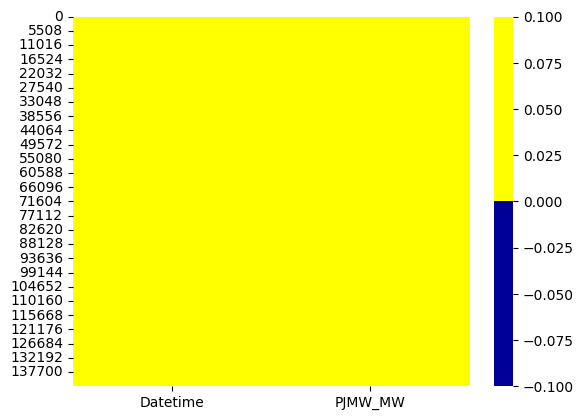

In [13]:
#heatmap for NA values
import seaborn as sns
colours = ['#000099', '#ffff00'] # specify the colours - yellow is not missing. blue is missing.
sns.heatmap(data.isnull(),
            cmap = sns.color_palette(colours))
plt.show()

`The dataset no any NA values so the heatmap is blank`

In [14]:
#checking for duplication of data
data[data.duplicated()].shape

(0, 2)

`Dataset has no any duplicate values`

In [15]:
#making the month column as index
data.set_index('Datetime',inplace=True)

In [16]:
data.head()

,PJMW_MW
Datetime,
2002-12-31 01:00:00,5077
2002-12-31 02:00:00,4939
2002-12-31 03:00:00,4885
2002-12-31 04:00:00,4857
2002-12-31 05:00:00,4930


In [17]:
data.index.year.unique()

Int64Index([2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012,
            2013, 2014, 2015, 2016, 2017, 2018],
           dtype='int64', name='Datetime')

`The dataset of PJM has given data from the year 2002 to 2018`

In [18]:
df = data.copy() #copied the data from dataset to df so that any changes done to coppied data does not reflect to original data

In [19]:
df.head()

,PJMW_MW
Datetime,
2002-12-31 01:00:00,5077
2002-12-31 02:00:00,4939
2002-12-31 03:00:00,4885
2002-12-31 04:00:00,4857
2002-12-31 05:00:00,4930


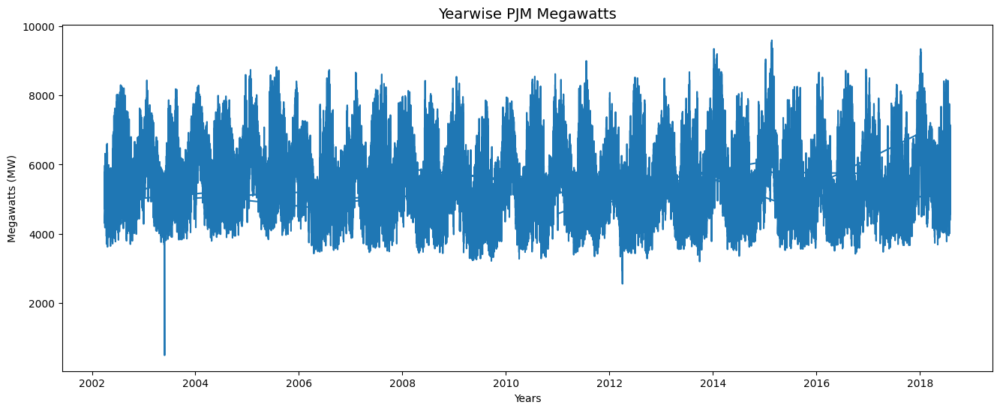

In [20]:
#line chart
plt.figure(figsize = (16, 6))
plt.plot(df['PJMW_MW']) 
plt.title('Yearwise PJM Megawatts',fontdict={'fontsize': 14,'color': 'black'})
plt.xlabel('Years')
plt.ylabel('Megawatts (MW)')
plt.show()

<h3>Observations:</h3>
The data is scattered so we cant predict any trend over the graph but it has up and down scaling<br>
We can say thay in onre of the month of year 2003 there was an spike down in megawatt <br>
The graph has multiplicative seasonality as the frequency varies<br>
At some intervals' the peak is getting up and down which know as seasonality

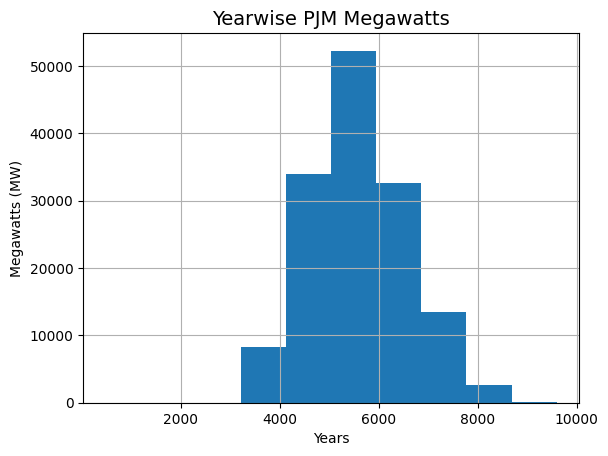

In [21]:
df.hist()
plt.title('Yearwise PJM Megawatts',fontdict={'fontsize': 14,'color': 'black'})
plt.xlabel('Years')
plt.ylabel('Megawatts (MW)')
plt.show()

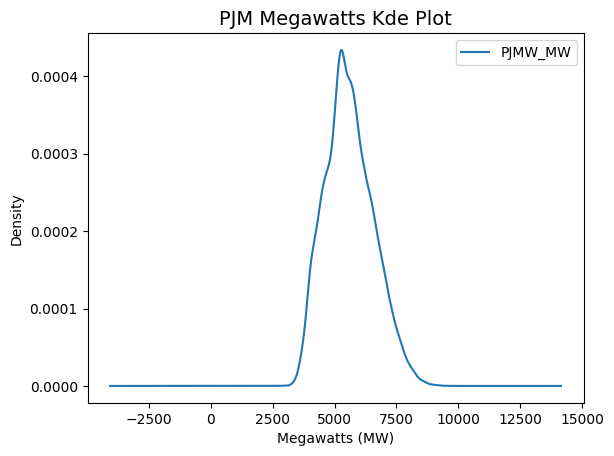

In [22]:
df.plot(kind='kde')
plt.title('PJM Megawatts Kde Plot',fontdict={'fontsize': 14,'color': 'black'})
plt.xlabel('Megawatts (MW)')
plt.show()

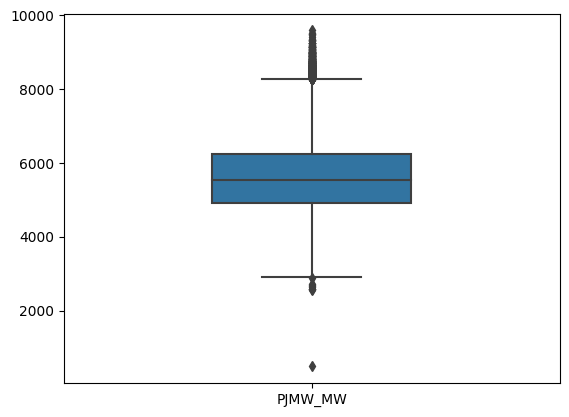

In [23]:
#checking for outleries
sns.boxplot(data =df,width=0.4)
plt.show()

<h3>Observations:</h3>
The PJMW_MW has Mean: 5602.37 <br>
There is an outlier has been detected<br>

In [24]:
#create a function to find outliers using IQR

def find_outliers_IQR(df):

   q1=df.quantile(0.25)

   q3=df.quantile(0.75)

   IQR=q3-q1

   outliers = df[((df<(q1-1.5*IQR)) | (df>(q3+1.5*IQR)))]

   return outliers

`Notice using .quantile() we can define Q1 and Q3. Next we calculate IQR, then we use the values to find the outliers in the dataframe. Since it takes a dataframe, we can input one or multiple columns at a time.First run MW through the function to return a series of the outliers.`

In [25]:
outliers = find_outliers_IQR(df['PJMW_MW'])

print("number of outliers:" + str(len(outliers)))

print("max outlier value: "+ str(outliers.max()))

print("min outlier value: "+ str(outliers.min()))

outliers

number of outliers:703
max outlier value: 9594
min outlier value: 487


Datetime
2002-07-29 18:00:00    8270
2002-07-22 17:00:00    8300
2003-05-29 00:00:00     487
2003-01-23 18:00:00    8296
2003-01-23 19:00:00    8431
                       ... 
2018-01-02 21:00:00    8563
2018-01-02 22:00:00    8322
2018-01-01 19:00:00    8328
2018-01-01 20:00:00    8401
2018-01-01 21:00:00    8373
Name: PJMW_MW, Length: 703, dtype: int64

### Deal with outliers in the dataframe using Winsorization
Winsorized mean is a method of averaging that initially replaces the smallest and largest values with the observations closest to them. This is done to limit the effect of outliers or abnormal extreme values, or outliers, on the calculation. For example, a 90% winsorization would see all data below the 5th percentile set to the 5th percentile, and data above the 95th percentile set to the 95th percentile.

In [26]:
#define the percentile limits for winsorization 
pct_lower = 0.01
pct_upper = 0.95

df['PJMW_MW'] = np.clip(df['PJMW_MW'],
                df['PJMW_MW'].quantile(pct_lower),
                df['PJMW_MW'].quantile(pct_upper))

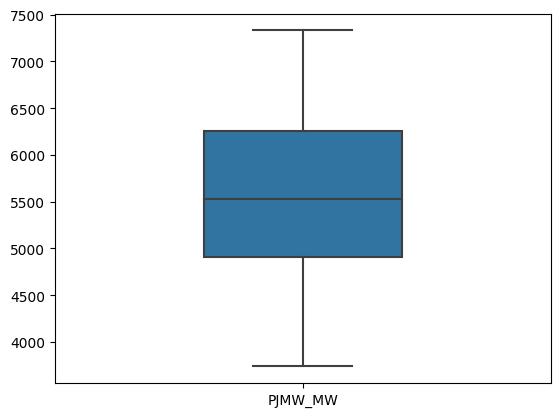

In [27]:
#rechecking for outleries
sns.boxplot(data =df,width=0.4)
plt.show()

In [28]:
#histogram for sales
fig = px.histogram(df, x="PJMW_MW")
fig.show()

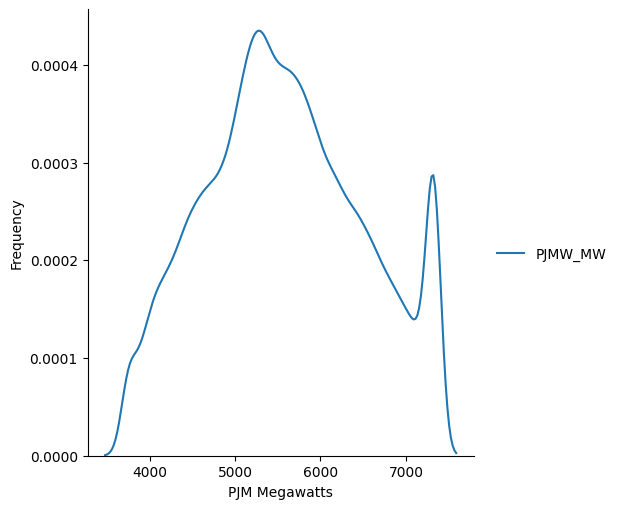

In [29]:
#hdisplot for sales
sns.displot(df, kind="kde")
plt.xlabel('PJM Megawatts')
plt.ylabel('Frequency')
plt.show()

<h3>Observations:</h3>
There is an showing nearly Normal distribution in graph<br>
The frequency of megawatts between 4000 to 6500 the variance is high <br>
At value nearlt 5100 the peak is high it is its mean value

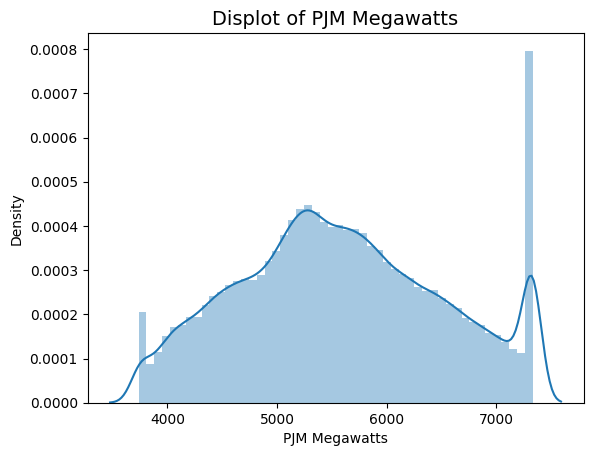

In [30]:
# line plot
sns.distplot(df['PJMW_MW'])
plt.title('Displot of PJM Megawatts',fontdict={'fontsize': 14,'color': 'black'})
plt.xlabel('PJM Megawatts')
plt.show()

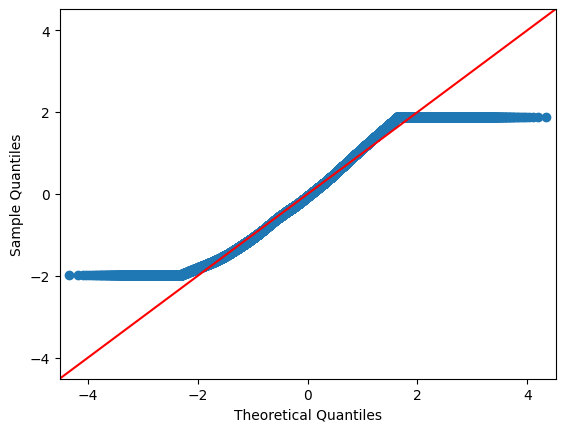

In [31]:
plot = sm.qqplot(df['PJMW_MW'],line = "45" , fit=True)

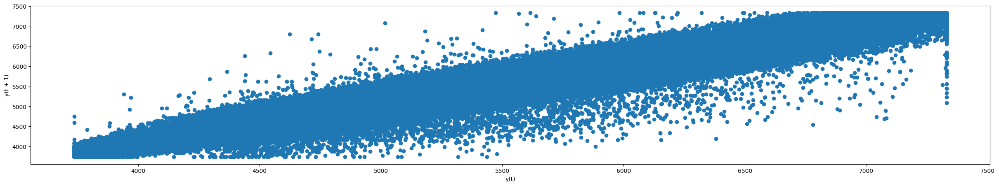

In [32]:
from pandas.plotting import lag_plot
plt.figure(figsize=(30,5))
lag_plot(df["PJMW_MW"])
plt.show()

`This shows that the data are strongly non-random.It has an upward trend and positive correlation.`

In [33]:
df.index

DatetimeIndex(['2002-12-31 01:00:00', '2002-12-31 02:00:00',
               '2002-12-31 03:00:00', '2002-12-31 04:00:00',
               '2002-12-31 05:00:00', '2002-12-31 06:00:00',
               '2002-12-31 07:00:00', '2002-12-31 08:00:00',
               '2002-12-31 09:00:00', '2002-12-31 10:00:00',
               ...
               '2018-01-01 15:00:00', '2018-01-01 16:00:00',
               '2018-01-01 17:00:00', '2018-01-01 18:00:00',
               '2018-01-01 19:00:00', '2018-01-01 20:00:00',
               '2018-01-01 21:00:00', '2018-01-01 22:00:00',
               '2018-01-01 23:00:00', '2018-01-02 00:00:00'],
              dtype='datetime64[ns]', name='Datetime', length=143206, freq=None)

In [34]:
df['date']=df.index
df['hour']=df['date'].dt.hour
df['dayofweek']=df['date'].dt.dayofweek
df['quarter']=df['date'].dt.quarter
df["month"] = df['date'].dt.strftime("%b")
df["day"] = df['date'].dt.strftime("%d")
df['year']=df['date'].dt.year
df['dayofyear']=df['date'].dt.dayofyear
df['dayofmonth']=df['date'].dt.day
df['weekofyear']=df['date'].dt.weekofyear
df['weekday_name'] = df['date'].dt.day_name()
df.drop(['date'], axis = 1, inplace=True)

In [35]:
df.head()

,PJMW_MW,hour,dayofweek,quarter,month,day,year,dayofyear,dayofmonth,weekofyear,weekday_name
Datetime,,,,,,,,,,,
2002-12-31 01:00:00,5077.0,1,1,4,Dec,31,2002,365,31,1,Tuesday
2002-12-31 02:00:00,4939.0,2,1,4,Dec,31,2002,365,31,1,Tuesday
2002-12-31 03:00:00,4885.0,3,1,4,Dec,31,2002,365,31,1,Tuesday
2002-12-31 04:00:00,4857.0,4,1,4,Dec,31,2002,365,31,1,Tuesday
2002-12-31 05:00:00,4930.0,5,1,4,Dec,31,2002,365,31,1,Tuesday


In [36]:
df.tail()

,PJMW_MW,hour,dayofweek,quarter,month,day,year,dayofyear,dayofmonth,weekofyear,weekday_name
Datetime,,,,,,,,,,,
2018-01-01 20:00:00,7330.0,20,0,1,Jan,01,2018,1,1,1,Monday
2018-01-01 21:00:00,7330.0,21,0,1,Jan,01,2018,1,1,1,Monday
2018-01-01 22:00:00,7330.0,22,0,1,Jan,01,2018,1,1,1,Monday
2018-01-01 23:00:00,7330.0,23,0,1,Jan,01,2018,1,1,1,Monday
2018-01-02 00:00:00,7330.0,0,1,1,Jan,02,2018,2,2,1,Tuesday


In [37]:
df.head()

,PJMW_MW,hour,dayofweek,quarter,month,day,year,dayofyear,dayofmonth,weekofyear,weekday_name
Datetime,,,,,,,,,,,
2002-12-31 01:00:00,5077.0,1,1,4,Dec,31,2002,365,31,1,Tuesday
2002-12-31 02:00:00,4939.0,2,1,4,Dec,31,2002,365,31,1,Tuesday
2002-12-31 03:00:00,4885.0,3,1,4,Dec,31,2002,365,31,1,Tuesday
2002-12-31 04:00:00,4857.0,4,1,4,Dec,31,2002,365,31,1,Tuesday
2002-12-31 05:00:00,4930.0,5,1,4,Dec,31,2002,365,31,1,Tuesday


In [38]:
df['season']=df['month'].copy()

In [39]:
df['season']=df['season'].map({'Jan':'Winter','Feb':'Winter','Mar':'Spring','Apr':'Spring','May':'Spring','Jun':'Summer','jul':'Summer','Aug':'Summer','Sep':'Fall','oct':'Fall','nov':'Fall','Dec':'Winter'})

In [40]:
df.head()

,PJMW_MW,hour,dayofweek,quarter,month,day,year,dayofyear,dayofmonth,weekofyear,weekday_name,season
Datetime,,,,,,,,,,,,
2002-12-31 01:00:00,5077.0,1,1,4,Dec,31,2002,365,31,1,Tuesday,Winter
2002-12-31 02:00:00,4939.0,2,1,4,Dec,31,2002,365,31,1,Tuesday,Winter
2002-12-31 03:00:00,4885.0,3,1,4,Dec,31,2002,365,31,1,Tuesday,Winter
2002-12-31 04:00:00,4857.0,4,1,4,Dec,31,2002,365,31,1,Tuesday,Winter
2002-12-31 05:00:00,4930.0,5,1,4,Dec,31,2002,365,31,1,Tuesday,Winter


In [41]:
df.columns

Index(['PJMW_MW', 'hour', 'dayofweek', 'quarter', 'month', 'day', 'year',
       'dayofyear', 'dayofmonth', 'weekofyear', 'weekday_name', 'season'],
      dtype='object')

### Boxplot Visualization 

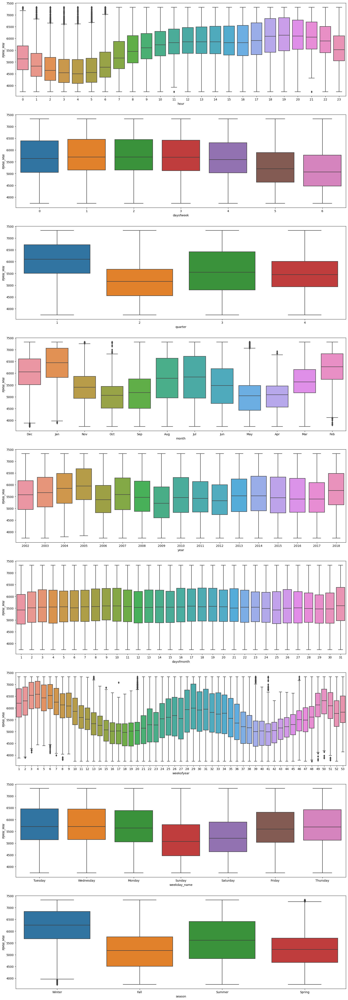

In [42]:
#loop to analyse power consumption for time features
vars_cat = ['hour', 'dayofweek', 'quarter', 'month', 'year',
       'dayofmonth', 'weekofyear', 'weekday_name', 'season']
plt.figure(figsize=(20,60))
for i in enumerate(vars_cat):
    plt.subplot(9,1,i[0]+1)
    sns.boxplot(data=df, x=i[1], y='PJMW_MW')
plt.show()

## Yearly wise Trend

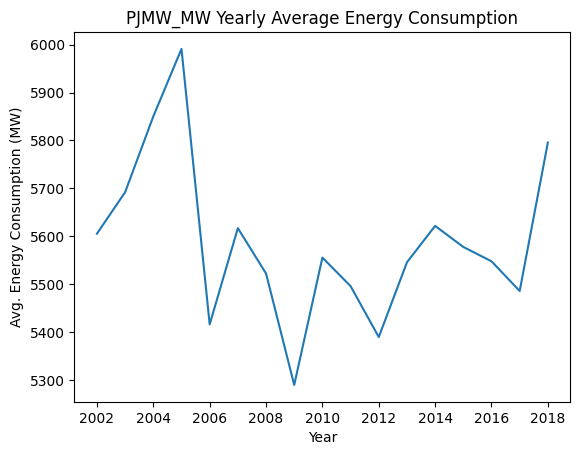

In [43]:
sns.lineplot(data=df.groupby('year').mean(),x='year',y='PJMW_MW')
plt.title('PJMW_MW Yearly Average Energy Consumption', fontsize=12)
plt.xlabel('Year')
plt.ylabel('Avg. Energy Consumption (MW)')
plt.show()

<h3>Observations:</h3>
The energy consumption in the year 2002 to 2005 was gradually in increasing order<br>
But after 2005 it has gone decreased till 2006<br>
After it the energy get increased and decreased as the new yesr arrives<br>

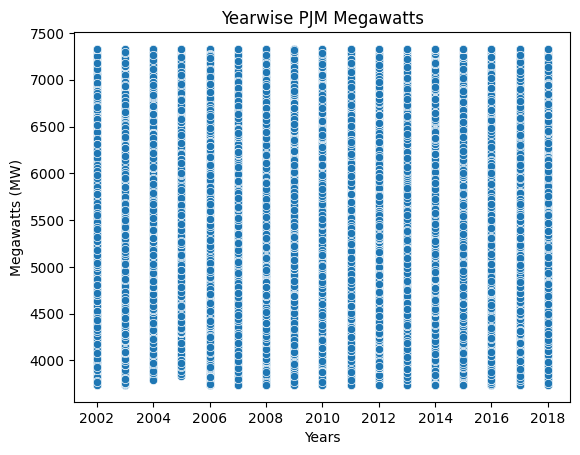

In [44]:
sns.scatterplot(x='year',y='PJMW_MW',data=df)
plt.title('Yearwise PJM Megawatts',fontdict={'fontsize': 12,'color': 'black'})
plt.xlabel('Years')
plt.ylabel('Megawatts (MW)')
plt.show()

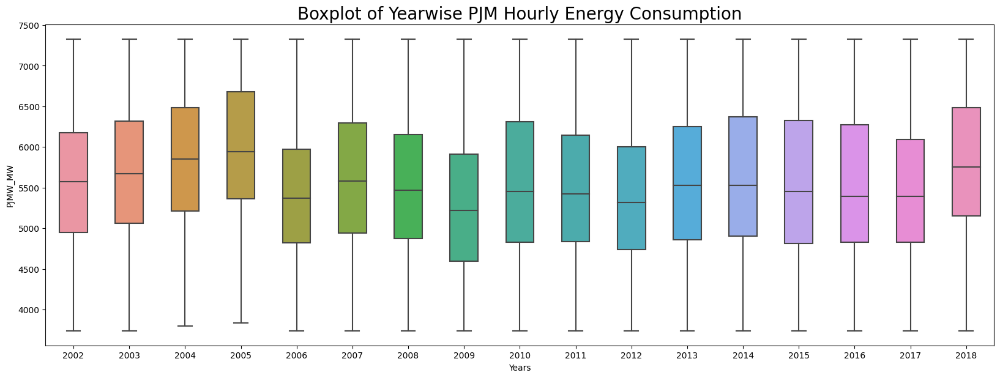

In [45]:
# Boxplot for ever
plt.figure(figsize=(20,15))
plt.subplot(211)
sns.boxplot(x="year",y="PJMW_MW",data=df,width=0.5)
plt.title('Boxplot of Yearwise PJM Hourly Energy Consumption',fontdict={'fontsize': 20})
plt.xlabel('Years')
plt.show()

<AxesSubplot: xlabel='year', ylabel='PJMW_MW'>

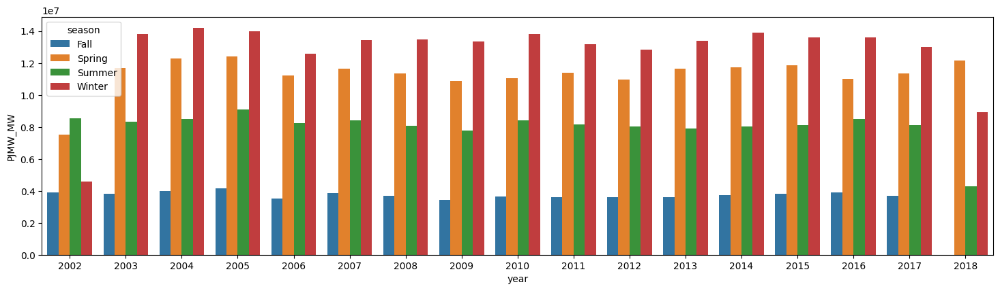

In [46]:
plt.figure(figsize=(18,10))
aux1 = df[['year', 'season', 'PJMW_MW']].groupby( ['year', 'season'] ).sum().reset_index()
plt.subplot( 2, 1, 2 )
sns.barplot( x='year', y='PJMW_MW', hue='season', data=aux1 )

`In the winter season most of the energy has been consumed thoroughly the years.
 Whereas, in the season of fall the less energy got consumed.`

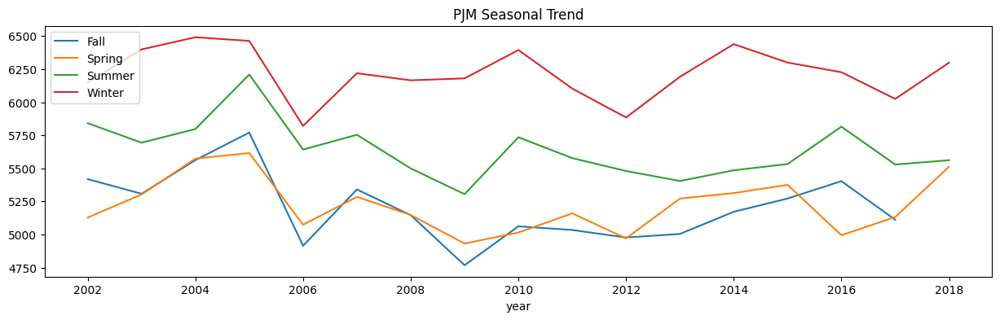

In [47]:
df.pivot_table(index=df['year'], 
                     columns='season', 
                     values='PJMW_MW',
                     aggfunc='mean').plot(figsize=(15,4),
                     title='PJM Seasonal Trend')
plt.legend(loc='upper left')

### Observation: 
The highest energy consumption can be seen in the year 2003 to 2004<br>
Highest power consumption is between 2004 to 2005 and less power consumption in 2002<br>
The lowest was in the year 2009 in fall season<br>
The high energy consumed in the winter and summer season due to climate changes in the US.

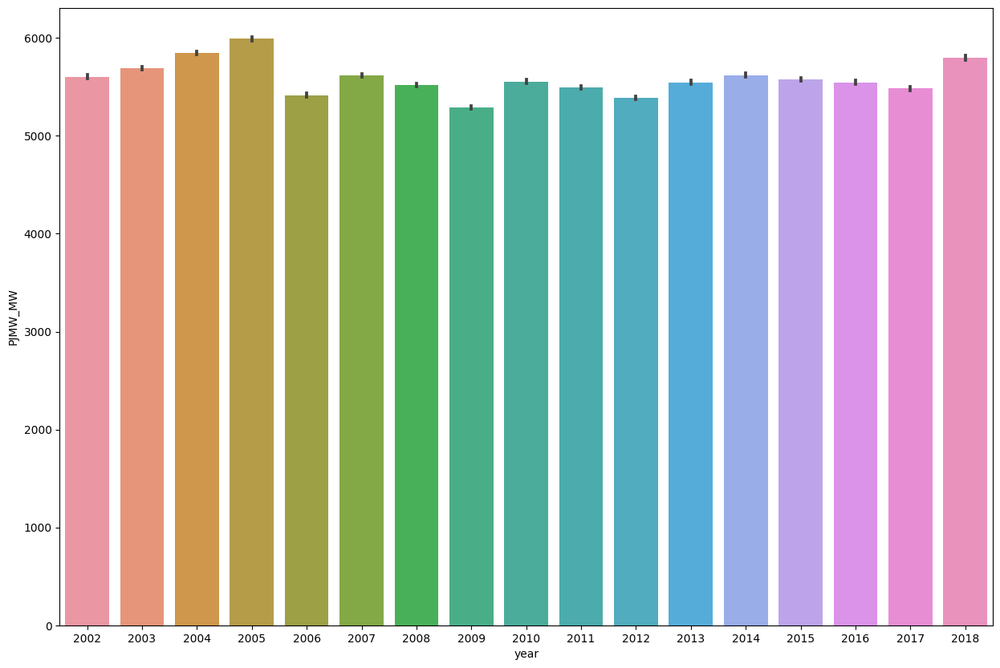

In [48]:
#bar plot 
plt.figure(figsize=(15,10))
sns.barplot(x='year',y='PJMW_MW',data=df)
plt.show()

<h3>Observations:</h3>
The energy consumed in the year 2005 has highest megawatt power used<br>
Whereas, in the year 2009 less energy was consumed <br>
There are gradually ups and downs in the energy consumption

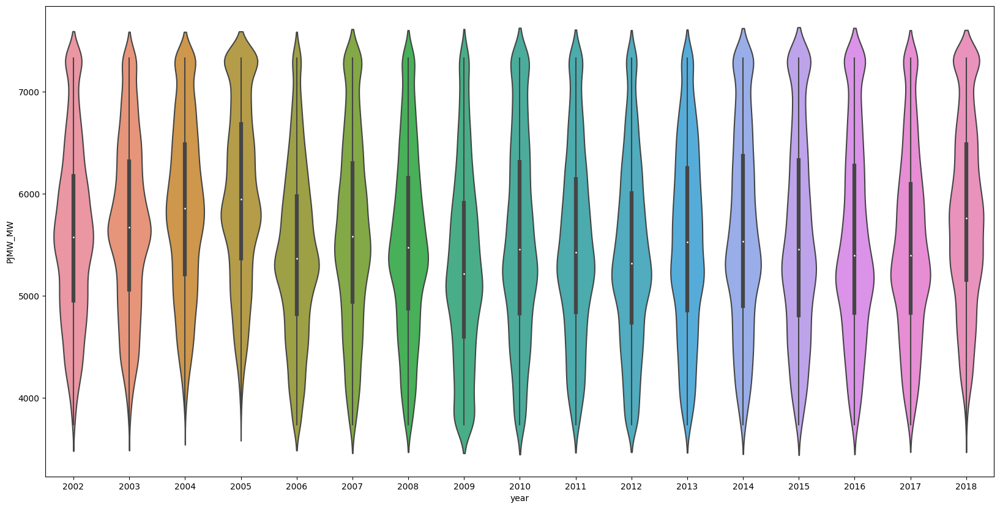

In [49]:
#violin plot
plt.figure(figsize=(20,10))
sns.violinplot(data=df, x="year", y="PJMW_MW",bw=.15)
plt.show()

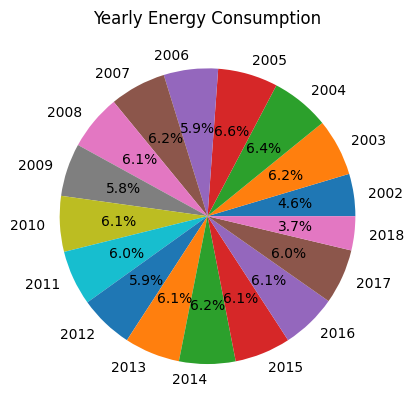

In [50]:

# Group by year and sum energy consumption
yearly_energy = df.groupby('year')['PJMW_MW'].sum()

# Create pie chart
yearly_energy.plot(kind='pie', title='Yearly Energy Consumption', autopct='%1.1f%%', ylabel='')
plt.show()

## Month wise Trend

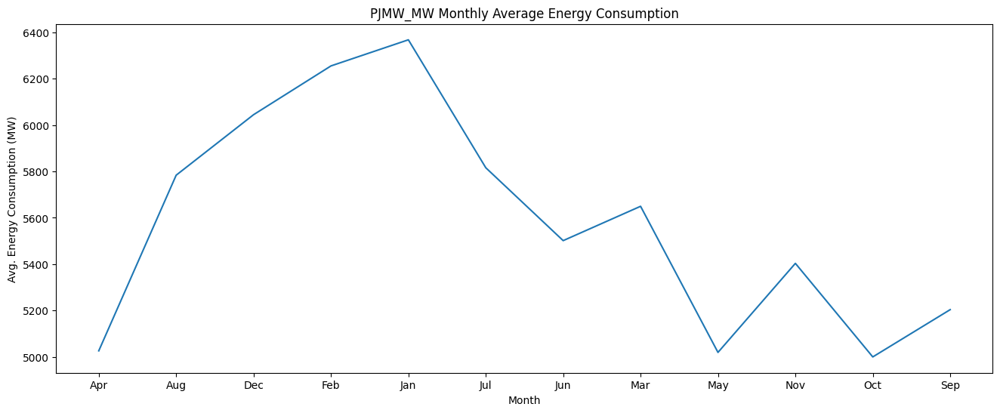

In [51]:
plt.figure(figsize=(16,6))
sns.lineplot(data=df.groupby('month').mean(),x='month',y='PJMW_MW')
plt.title('PJMW_MW Monthly Average Energy Consumption', fontsize=12)
plt.xlabel('Month')
plt.ylabel('Avg. Energy Consumption (MW)')
plt.show()

### Observation :
The Monthly average consumption is highest in the month of January and lowest in thr October<br>
As there is winter season in January<br>

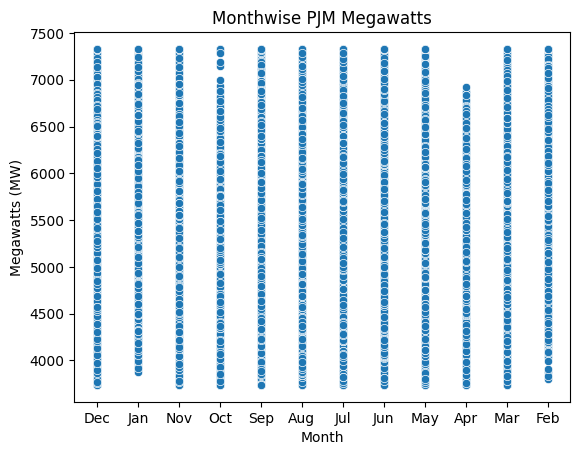

In [52]:
sns.scatterplot(x='month',y='PJMW_MW',data=df)
plt.title('Monthwise PJM Megawatts',fontdict={'fontsize': 12,'color': 'black'})
plt.xlabel('Month')
plt.ylabel('Megawatts (MW)')
plt.show()

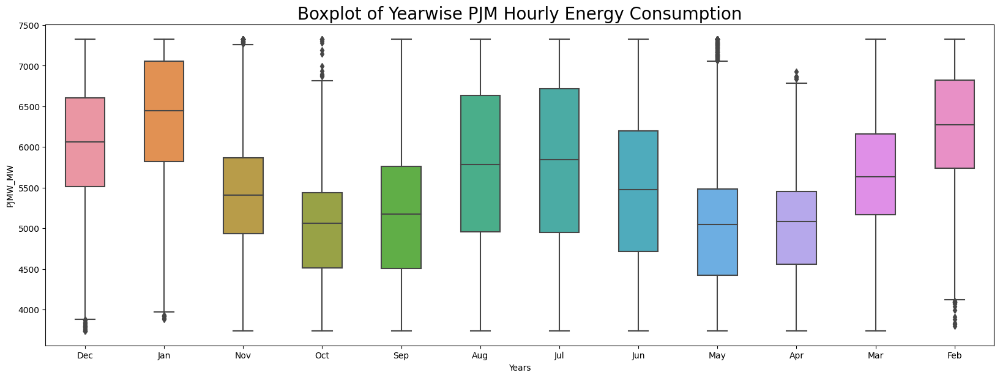

In [53]:
# Boxplot for ever
plt.figure(figsize=(20,15))
plt.subplot(211)
sns.boxplot(x="month",y="PJMW_MW",data=df,width=0.5)
plt.title('Boxplot of Yearwise PJM Hourly Energy Consumption',fontdict={'fontsize': 20})
plt.xlabel('Years')
plt.show()

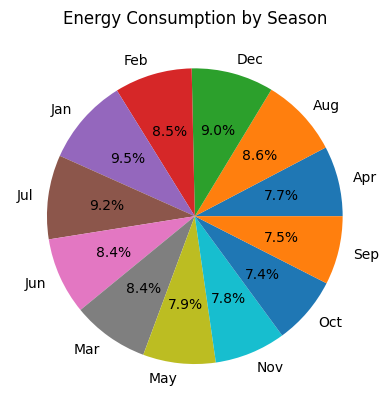

In [54]:
seasonal_energy = df.groupby('month')['PJMW_MW'].sum()

# Create pie chart
seasonal_energy.plot(kind='pie', title='Energy Consumption by Season', autopct='%1.1f%%', ylabel='')
plt.show()

## Hourly wise Trend

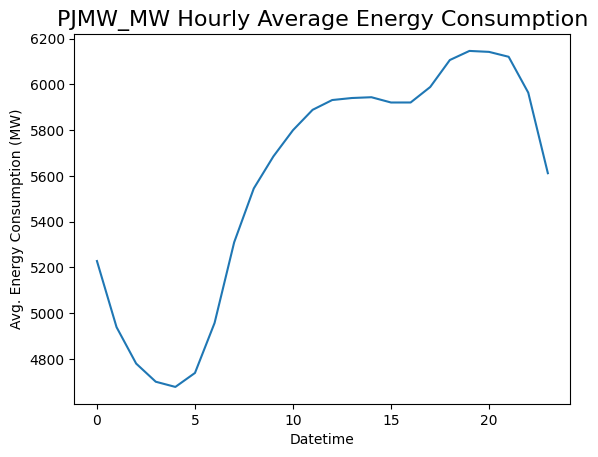

In [55]:
sns.lineplot(data=df.groupby('hour').mean(),x='hour',y='PJMW_MW')
plt.title('PJMW_MW Hourly Average Energy Consumption', fontsize=16)
plt.xlabel('Datetime')
plt.ylabel('Avg. Energy Consumption (MW)')
plt.show()

<h3>Observations:</h3>
On the hourly average basis most of the energy is getting consumed in 5 oclock to 21 and after it gets in decrese<br>

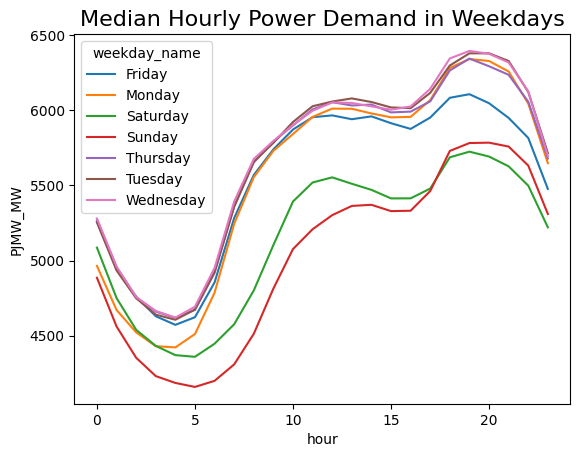

In [56]:
data = df.groupby(['hour', 'weekday_name'], as_index=False).agg({'PJMW_MW':'median'})
sns.lineplot(data= data,x='hour',y='PJMW_MW', hue='weekday_name')
plt.title('Median Hourly Power Demand in Weekdays', fontsize=16)
plt.show()

<h3>Observations:</h3>
Demand for electricity is lower during the weekends and friday afternoon onwards

In [57]:
fig=px.scatter(df,x='hour',y='PJMW_MW',title='Hourly PJM Megawatts',
                 labels={"hour": "Hours"})
fig.show()

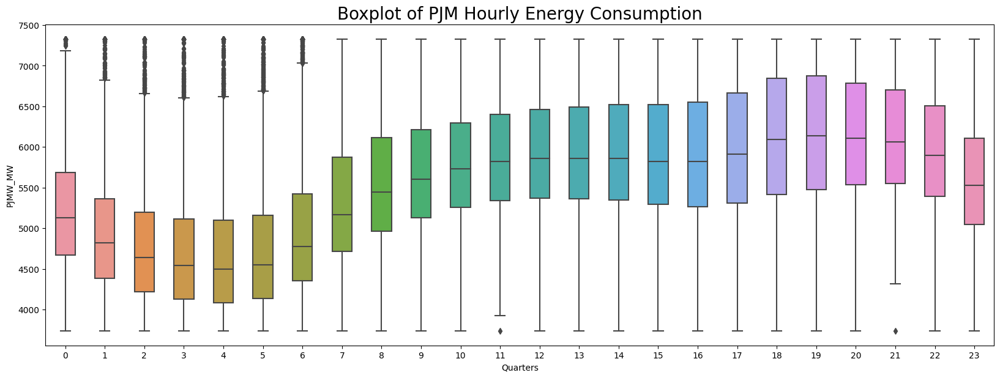

In [58]:
# Boxplot for ever
plt.figure(figsize=(20,15))
plt.subplot(211)
sns.boxplot(x="hour",y="PJMW_MW",data=df,width=0.5)
plt.title('Boxplot of PJM Hourly Energy Consumption',fontdict={'fontsize': 20})
plt.xlabel('Quarters')
plt.show()

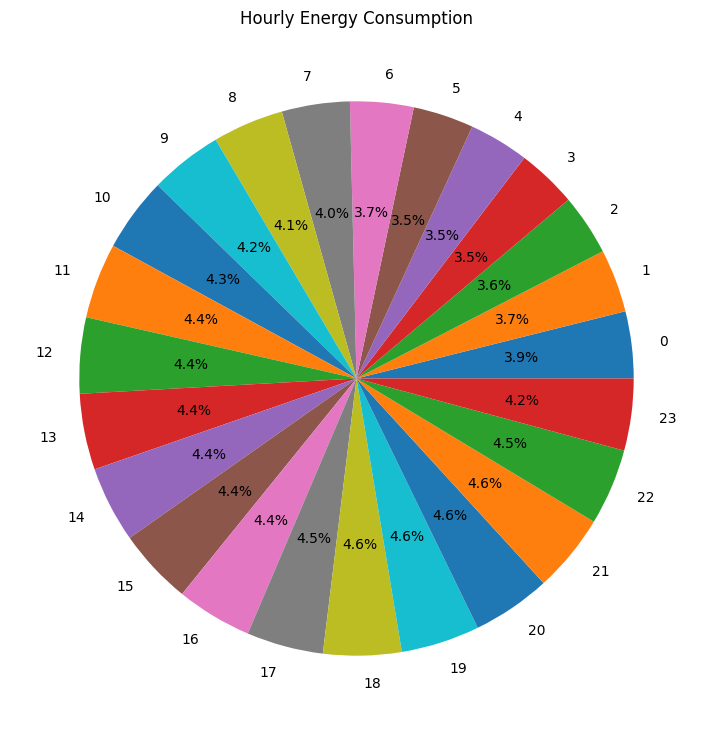

In [59]:
# Group by hour and sum energy consumption
yearly_energy = df.groupby('hour')['PJMW_MW'].sum()

# Create pie chart
yearly_energy.plot(kind='pie', title='Hourly Energy Consumption', autopct='%1.1f%%', ylabel='',figsize=(9,9))
plt.show()

### Observation:
It's observed that high amount of power is consumed from 6pm to 9pm and less amount of power is consumed from 3am to 5am 

 ## WeekDay wise Trend

<AxesSubplot: xlabel='weekday_name', ylabel='PJMW_MW'>

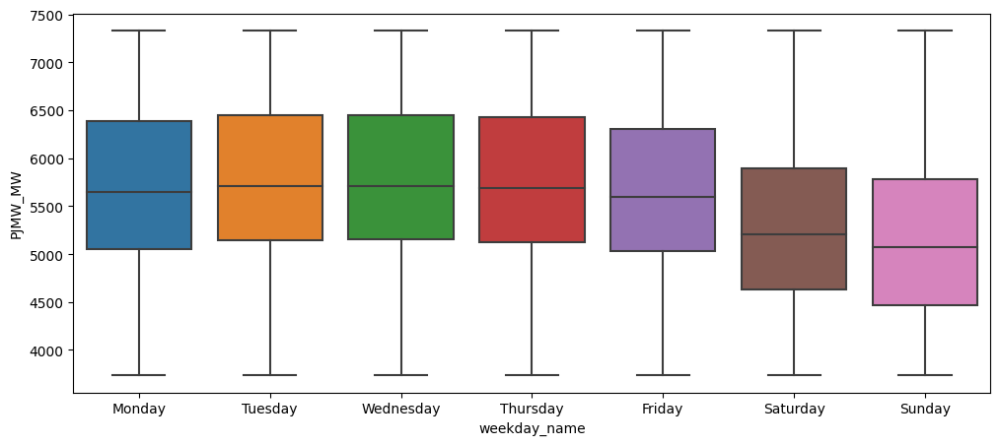

In [60]:
fig, ax = plt.subplots(figsize=(12,5))
sns.boxplot(x = df.weekday_name,
                y = df['PJMW_MW'],order=['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday'],
                ax = ax)

`From Monday to Thursday the energy consumption is slightly linear but after Thursday it is gradually decresing.As, in the weekdays the people use more energy in the office,store,etc. But in the weekends there is low energy is consumed.`

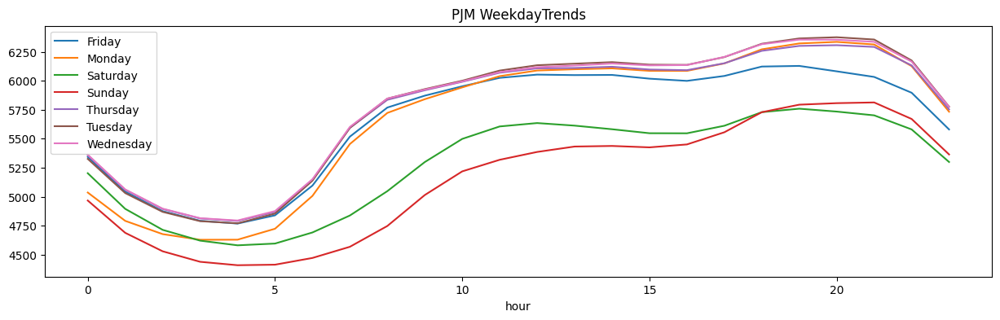

In [61]:
df.pivot_table(index=df['hour'], 
                     columns='weekday_name', 
                     values='PJMW_MW',
                     aggfunc='mean').plot(figsize=(15,4),
                     title='PJM WeekdayTrends')
plt.legend(loc='upper left')

### Observation:
The plot shows that there are less consumption of power during weekends as compared to weekdays. Also the power consumption began to rise from morning 7 and at midnight 10 it again decreases.

## Daily wise Trend

<AxesSubplot: xlabel='day', ylabel='PJMW_MW'>

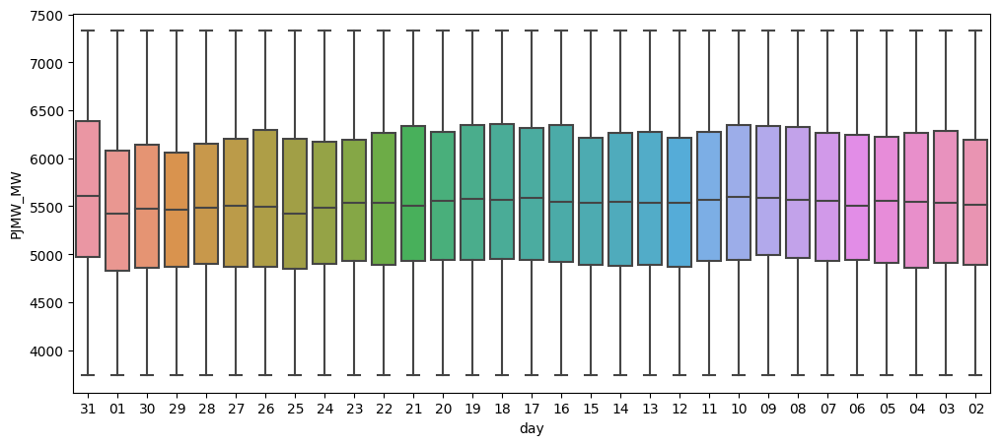

In [62]:
fig, ax = plt.subplots(figsize=(12,5))
sns.boxplot(x = df.day,
                y = df['PJMW_MW'],
                ax = ax)

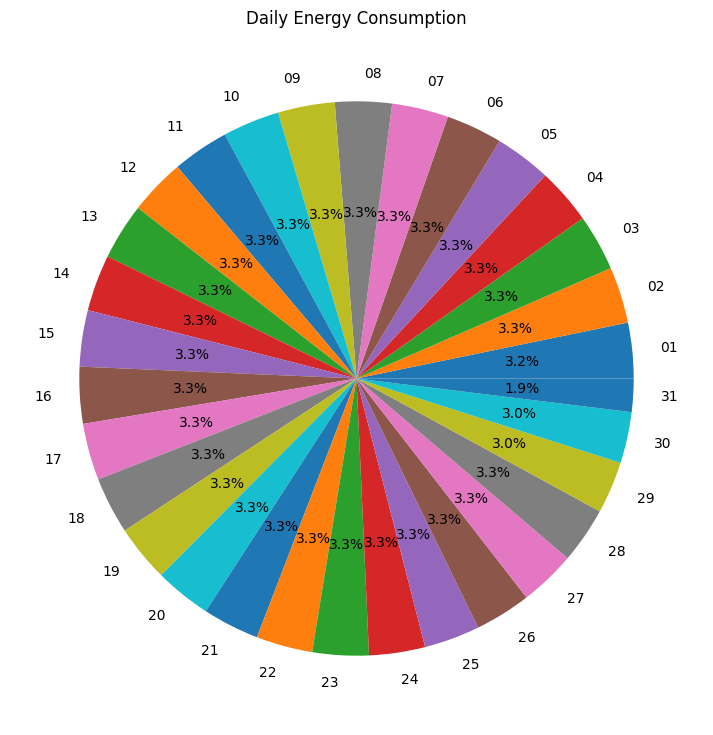

In [63]:
# Group by day and sum energy consumption
yearly_energy = df.groupby('day')['PJMW_MW'].sum()

# Create pie chart
yearly_energy.plot(kind='pie', title='Daily Energy Consumption', autopct='%1.1f%%', ylabel='',figsize=(10,9))
plt.show()

### Observation
It's observed that power consuming is getting decresed in the last 3 days of the month

## Quarter wise Trend

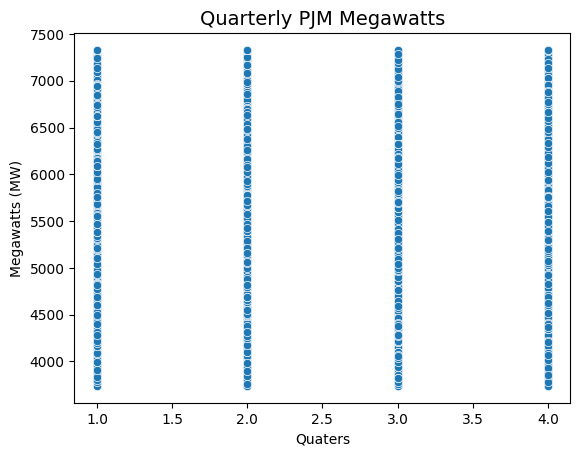

In [64]:
sns.scatterplot(x='quarter',y='PJMW_MW',data=df)
plt.title('Quarterly PJM Megawatts',fontdict={'fontsize': 14,'color': 'black'})
plt.xlabel('Quaters')
plt.ylabel('Megawatts (MW)')
plt.show()

<h3>Observations:</h3>
In the winter season the PJM Hourly Energy Consumption was to low<br>
But, in the summer season PJM Hourly Energy Consumption was high then in spring season <br>
In the Autumn season the energy consumption is high

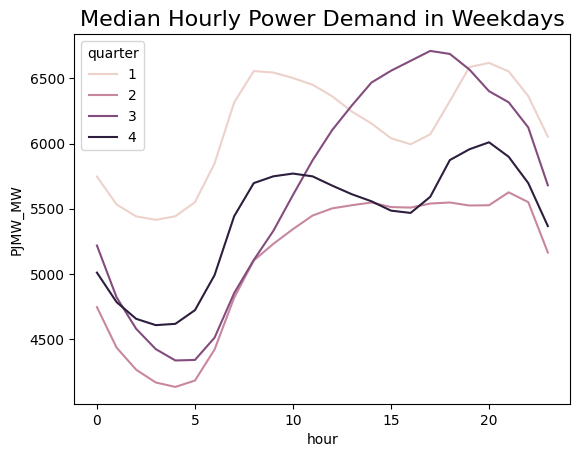

In [65]:
data = df.groupby(['hour', 'quarter'], as_index=False).agg({'PJMW_MW':'median'})
sns.lineplot(data=data,x='hour',y='PJMW_MW', hue='quarter')
plt.title('Median Hourly Power Demand in Weekdays', fontsize=16)
plt.show()

<h3>Observations:</h3>
In the summer season PJM Hourly Energy Consumption was high <br>
With follwed to in winter season

In [66]:
df.quarter.value_counts()

2    37122
3    36121
4    35319
1    34644
Name: quarter, dtype: int64

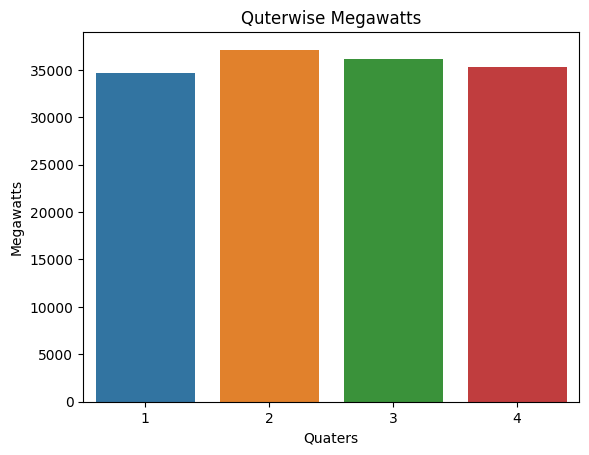

In [67]:
sns.countplot('quarter' ,data=df)
plt.title('Quterwise Megawatts',fontdict={'fontsize': 12,'color': 'black'})
plt.xlabel('Quaters')
plt.ylabel('Megawatts')
plt.show()

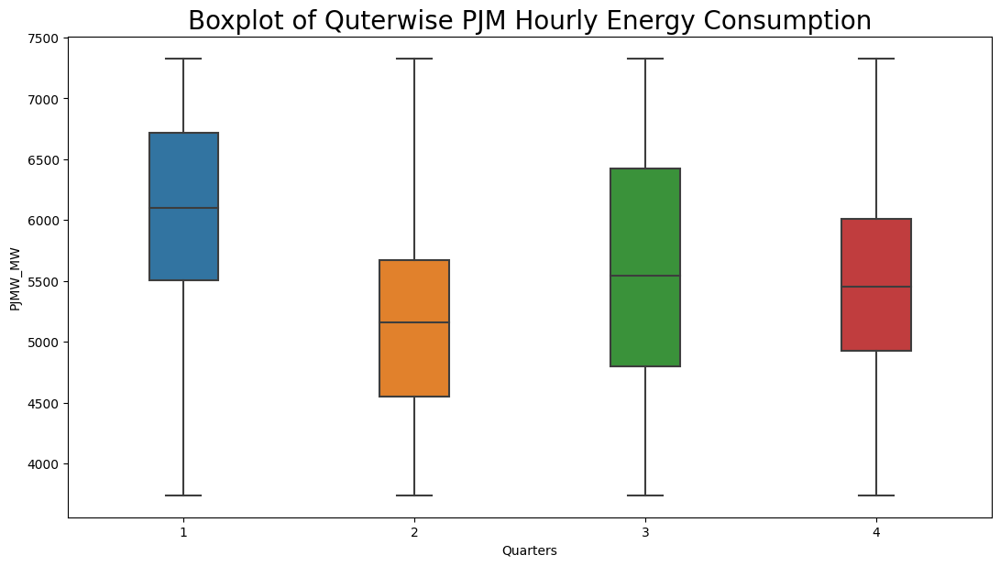

In [68]:
# Boxplot for ever
plt.figure(figsize=(13,15))
plt.subplot(211)
sns.boxplot(x="quarter",y="PJMW_MW",data=df,width=0.3)
plt.title('Boxplot of Quterwise PJM Hourly Energy Consumption',fontdict={'fontsize': 20})
plt.xlabel('Quarters')
plt.show()

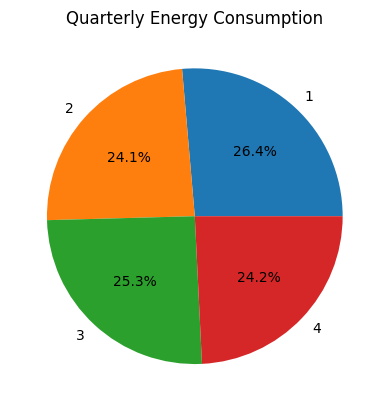

In [69]:
# Group by quarter and sum energy consumption
yearly_energy = df.groupby('quarter')['PJMW_MW'].sum()

# Create pie chart
yearly_energy.plot(kind='pie', title='Quarterly Energy Consumption', autopct='%1.1f%%', ylabel='')
plt.show()

### Observation:
In 1st quarter high amount of power is consumed

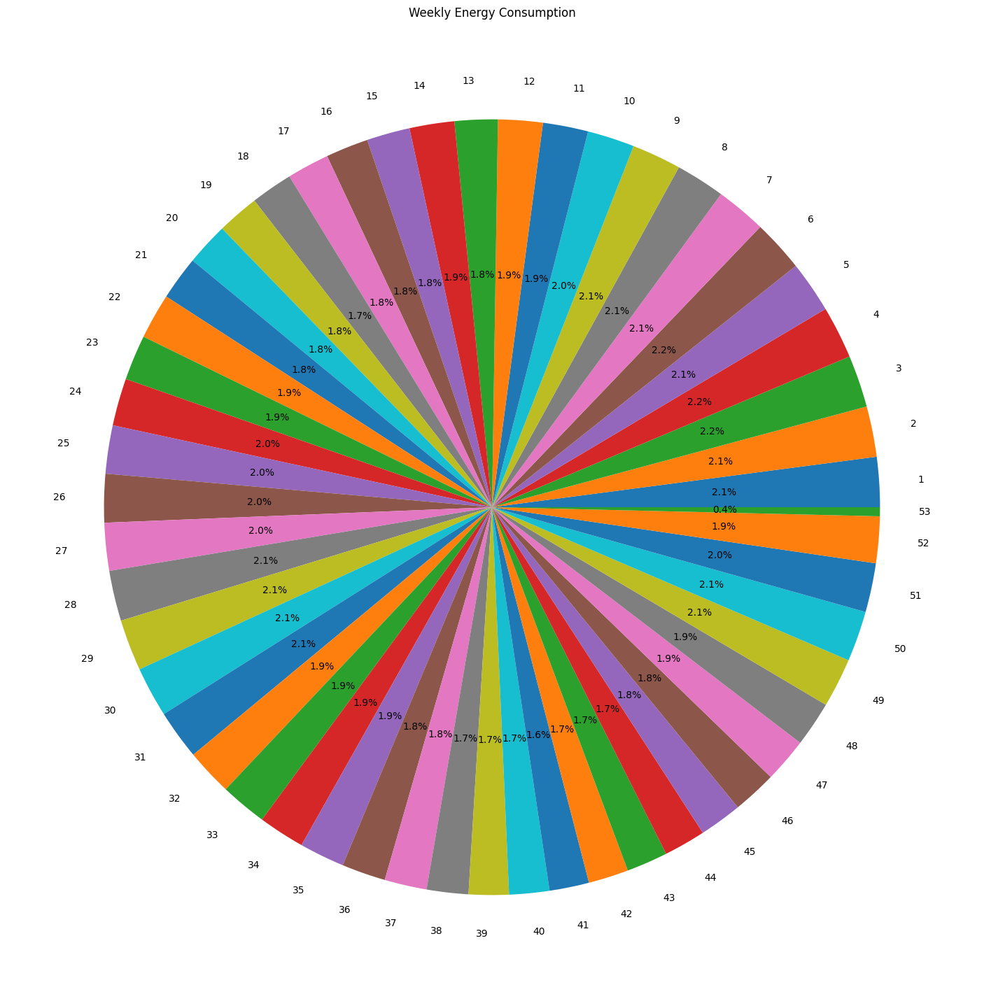

In [70]:
# Group by weekofyear and sum energy consumption
yearly_energy = df.groupby('weekofyear')['PJMW_MW'].sum()

# Create pie chart
yearly_energy.plot(kind='pie', title='Weekly Energy Consumption', autopct='%1.1f%%', ylabel='',figsize=(18,18))
plt.show()

### Observation:
As compare to other weekofyear less amount of power is consumed in 53rd week

<AxesSubplot: xlabel='season', ylabel='PJMW_MW'>

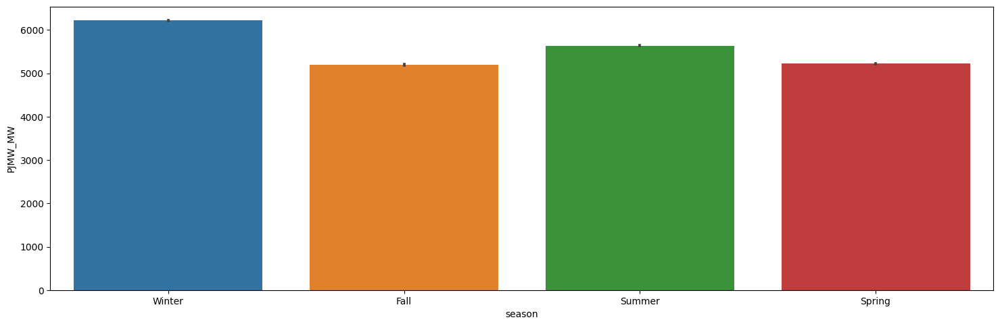

In [71]:
plt.figure(figsize=(18,12))
aux2 = df[['season', 'PJMW_MW']].groupby( 'season' ).sum().reset_index()
plt.subplot( 2, 1, 1 )
sns.barplot( x='season', y='PJMW_MW', data = df )

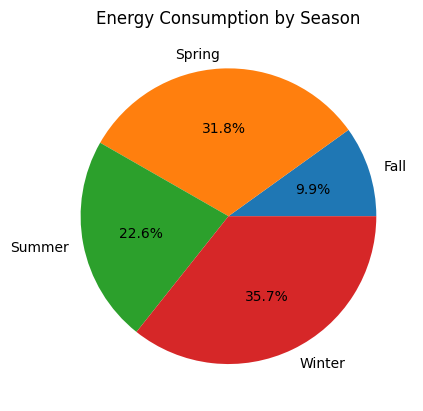

In [72]:
seasonal_energy = df.groupby('season')['PJMW_MW'].sum()

# Create pie chart
seasonal_energy.plot(kind='pie', title='Energy Consumption by Season', autopct='%1.1f%%', ylabel='')
plt.show()

In [73]:
df['date'] = df.index.date

In [74]:
df=df.reset_index()
df

,Datetime,PJMW_MW,hour,dayofweek,quarter,month,day,year,dayofyear,dayofmonth,weekofyear,weekday_name,season,date
0,2002-12-31 01:00:00,5077.0,1,1,4,Dec,31,2002,365,31,1,Tuesday,Winter,2002-12-31
1,2002-12-31 02:00:00,4939.0,2,1,4,Dec,31,2002,365,31,1,Tuesday,Winter,2002-12-31
2,2002-12-31 03:00:00,4885.0,3,1,4,Dec,31,2002,365,31,1,Tuesday,Winter,2002-12-31
3,2002-12-31 04:00:00,4857.0,4,1,4,Dec,31,2002,365,31,1,Tuesday,Winter,2002-12-31
4,2002-12-31 05:00:00,4930.0,5,1,4,Dec,31,2002,365,31,1,Tuesday,Winter,2002-12-31
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
143201,2018-01-01 20:00:00,7330.0,20,0,1,Jan,01,2018,1,1,1,Monday,Winter,2018-01-01
143202,2018-01-01 21:00:00,7330.0,21,0,1,Jan,01,2018,1,1,1,Monday,Winter,2018-01-01
143203,2018-01-01 22:00:00,7330.0,22,0,1,Jan,01,2018,1,1,1,Monday,Winter,2018-01-01
143204,2018-01-01 23:00:00,7330.0,23,0,1,Jan,01,2018,1,1,1,Monday,Winter,2018-01-01


In [75]:
# !pip install holidays

In [ ]:
# import holidays
# df['holidays'] = df.date.apply( lambda x: 'Holiday' if x in holidays.US() else 'Normal day' )

In [ ]:
# plt.figure(figsize=(18,8))

# aux1 = df[['holidays', 'PJMW_MW']].groupby( 'holidays' ).mean().reset_index()
# plt.subplot( 2, 1, 1 )
# sns.barplot( x='holidays', y='PJMW_MW', data=aux1 )

# aux2 = df[['year', 'holidays', 'PJMW_MW']].groupby( ['year', 'holidays'] ).mean().reset_index()
# plt.subplot( 2, 1, 2 )
# sns.barplot( x='year', y='PJMW_MW', hue='holidays', data=aux2 )

In [ ]:
# # Group by holidays and sum energy consumption
# yearly_energy = df.groupby('holidays')['PJMW_MW'].sum()

# # Create pie chart
# yearly_energy.plot(kind='pie', title='Holiday v/s Normal Day Energy Consumption', autopct='%1.1f%%', ylabel='')
# plt.show()

### Observation:
As compare to holidays more power is consumed in normal days

### Log and Squared in time series
`In time series analysis, this transformation is often considered to stabilize the variance of a series. We investigate under which conditions taking logs is beneficial for forecasting. Forecasts based on the original series are compared to forecasts based on logs.
A square root transformation can be useful for: Normalizing a skewed distribution. Transforming a non-linear relationship between 2 variables into a linear one. Reducing heteroscedasticity of the residuals in linear regression.
Generally, the logarithm or square root transformation can stabilize the variance`

In [76]:
df.shape

(143206, 14)

In [77]:
#adding columns t,t_squared and sales_log
df['t'] = np.arange(1,143207)
df['t_squared'] = df['t']**2
df["PJMW_log"] =np.log(df['PJMW_MW'])

In [78]:
df.drop(['date'], axis = 1, inplace=True)

In [79]:
df.head()

,Datetime,PJMW_MW,hour,dayofweek,quarter,month,day,year,dayofyear,dayofmonth,weekofyear,weekday_name,season,t,t_squared,PJMW_log
0,2002-12-31 01:00:00,5077.0,1,1,4,Dec,31,2002,365,31,1,Tuesday,Winter,1,1,8.532476
1,2002-12-31 02:00:00,4939.0,2,1,4,Dec,31,2002,365,31,1,Tuesday,Winter,2,4,8.504918
2,2002-12-31 03:00:00,4885.0,3,1,4,Dec,31,2002,365,31,1,Tuesday,Winter,3,9,8.493925
3,2002-12-31 04:00:00,4857.0,4,1,4,Dec,31,2002,365,31,1,Tuesday,Winter,4,16,8.488176
4,2002-12-31 05:00:00,4930.0,5,1,4,Dec,31,2002,365,31,1,Tuesday,Winter,5,25,8.503094


In [80]:
#making the month column as index
df.set_index('Datetime',inplace=True)

In [81]:
df.head()

,PJMW_MW,hour,dayofweek,quarter,month,day,year,dayofyear,dayofmonth,weekofyear,weekday_name,season,t,t_squared,PJMW_log
Datetime,,,,,,,,,,,,,,,
2002-12-31 01:00:00,5077.0,1,1,4,Dec,31,2002,365,31,1,Tuesday,Winter,1,1,8.532476
2002-12-31 02:00:00,4939.0,2,1,4,Dec,31,2002,365,31,1,Tuesday,Winter,2,4,8.504918
2002-12-31 03:00:00,4885.0,3,1,4,Dec,31,2002,365,31,1,Tuesday,Winter,3,9,8.493925
2002-12-31 04:00:00,4857.0,4,1,4,Dec,31,2002,365,31,1,Tuesday,Winter,4,16,8.488176
2002-12-31 05:00:00,4930.0,5,1,4,Dec,31,2002,365,31,1,Tuesday,Winter,5,25,8.503094


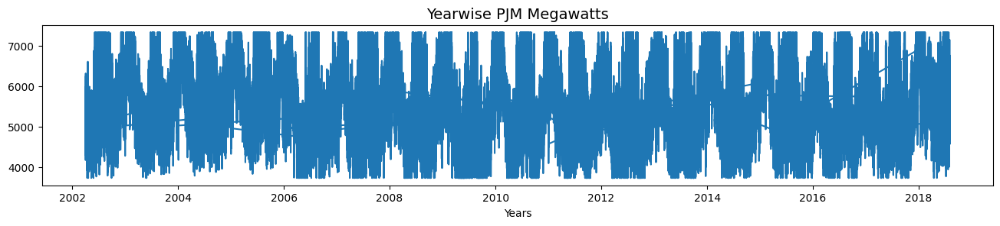

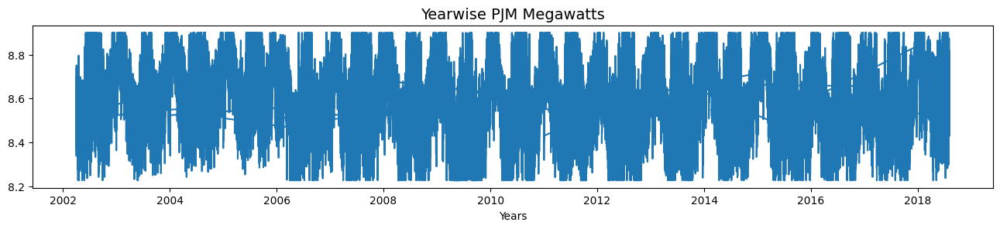

In [82]:
# line plot
plt.figure(figsize = (16, 6))
plt.subplot(211)
plt.plot(df['PJMW_MW'])
plt.title('Yearwise PJM Megawatts',fontdict={'fontsize': 14,'color': 'black'})
plt.xlabel('Years')
plt.show()

plt.figure(figsize = (16, 6))
plt.subplot(212)
plt.plot(df['PJMW_log'])
plt.title('Yearwise PJM Megawatts',fontdict={'fontsize': 14,'color': 'black'})
plt.xlabel('Years')
plt.show()

<h3>Observations:</h3>
After taking log of the Megawatts we can see that there is slightly change has seen in the graph<br>
The variance has been stabilized<br>

## Heatmap of Energy Consumption of Each Year with Month

<AxesSubplot: xlabel='year', ylabel='month'>

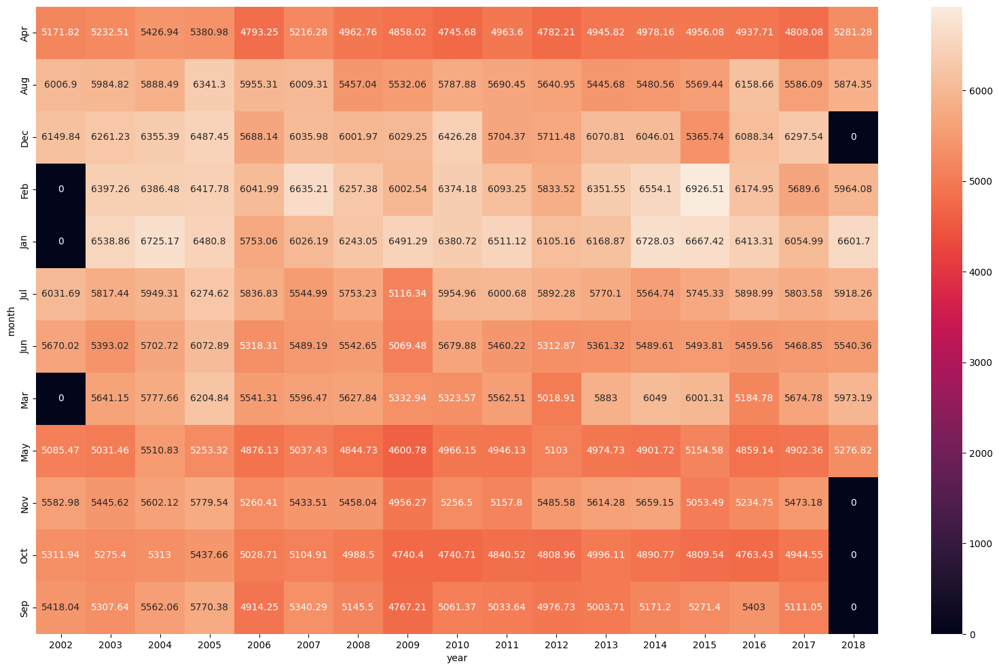

In [83]:
plt.figure(figsize=(20,12))
heatmap_y_month = pd.pivot_table(data=df,values="PJMW_MW",index="month",columns="year",aggfunc="mean",fill_value=0)
sns.heatmap(heatmap_y_month,annot=True,fmt="g") #fmt is format of the grid values

### Observations:
In the Year 2005 in Feb month the highest energy has been consumed with respect to others<br>
The regions have changed over the years so data may only appear for certain dates per region due tio which there are some columns has 0 values.<br>
We can seee that in the months of Aug, Dec, Feb and Jan the energy consumption is high throughly the coming year.

In [84]:
df.columns

Index(['PJMW_MW', 'hour', 'dayofweek', 'quarter', 'month', 'day', 'year',
       'dayofyear', 'dayofmonth', 'weekofyear', 'weekday_name', 'season', 't',
       't_squared', 'PJMW_log'],
      dtype='object')

`LabelEncoder can be used to normalize labels. It can also be used to transform non-numerical labels (as long as they are hashable and comparable) to numerical labels. Fit label encoder. Fit label encoder and return encoded labels.`

In [85]:
string_columns = ['month', 'weekday_name', 'season']

In [89]:
from sklearn.preprocessing import LabelEncoder

In [90]:
#Preprocessing the data. As, there are categorical variables
number = LabelEncoder()
for i in string_columns:
        df[i]= number.fit_transform(df[i])

In [91]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 143206 entries, 2002-12-31 01:00:00 to 2018-01-02 00:00:00
Data columns (total 15 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   PJMW_MW       143206 non-null  float64
 1   hour          143206 non-null  int64  
 2   dayofweek     143206 non-null  int64  
 3   quarter       143206 non-null  int64  
 4   month         143206 non-null  int32  
 5   day           143206 non-null  object 
 6   year          143206 non-null  int64  
 7   dayofyear     143206 non-null  int64  
 8   dayofmonth    143206 non-null  int64  
 9   weekofyear    143206 non-null  int64  
 10  weekday_name  143206 non-null  int32  
 11  season        143206 non-null  int32  
 12  t             143206 non-null  int32  
 13  t_squared     143206 non-null  int32  
 14  PJMW_log      143206 non-null  float64
dtypes: float64(2), int32(5), int64(7), object(1)
memory usage: 14.7+ MB


In [92]:
df['day'] = df['day'].astype(str).astype(int)

### Splitting of data
`Separating data into training and testing sets is an important part of evaluating data mining models. Typically, when you separate a data set into a training set and testing set, most of the data is used for training, and a smaller portion of the data is used for testing`

In [93]:
#train test split mannually for time series
# train_data = df['PJMW_MW'].head(138071)
# test_data= df['PJMW_MW'].tail(5135)

train_data=df.loc[df.year < 2018]
test_data = df.loc[df.year >= 2018]

In [94]:
train_data.shape, test_data.shape

((138070, 15), (5136, 15))

In [95]:
train_data.tail()

,PJMW_MW,hour,dayofweek,quarter,month,day,year,dayofyear,dayofmonth,weekofyear,weekday_name,season,t,t_squared,PJMW_log
Datetime,,,,,,,,,,,,,,,
2017-01-01 20:00:00,5690.0,20,6,1,4,1,2017,1,1,52,3,3,138067,1882627305,8.646466
2017-01-01 21:00:00,5668.0,21,6,1,4,1,2017,1,1,52,3,3,138068,1882903440,8.642592
2017-01-01 22:00:00,5543.0,22,6,1,4,1,2017,1,1,52,3,3,138069,1883179577,8.620291
2017-01-01 23:00:00,5311.0,23,6,1,4,1,2017,1,1,52,3,3,138070,1883455716,8.577535
2017-01-02 00:00:00,5021.0,0,0,1,4,2,2017,2,2,1,1,3,138071,1883731857,8.521384


In [96]:
test_data.head()

,PJMW_MW,hour,dayofweek,quarter,month,day,year,dayofyear,dayofmonth,weekofyear,weekday_name,season,t,t_squared,PJMW_log
Datetime,,,,,,,,,,,,,,,
2018-01-01 00:00:00,7330.0,0,0,1,4,1,2018,1,1,1,1,3,129335,-452326959,8.899731
2018-08-02 01:00:00,5100.0,1,3,3,1,2,2018,214,2,31,4,2,138072,1884008000,8.536996
2018-08-02 02:00:00,4840.0,2,3,3,1,2,2018,214,2,31,4,2,138073,1884284145,8.484670
2018-08-02 03:00:00,4745.0,3,3,3,1,2,2018,214,2,31,4,2,138074,1884560292,8.464847
2018-08-02 04:00:00,4572.0,4,3,3,1,2,2018,214,2,31,4,2,138075,1884836441,8.427706


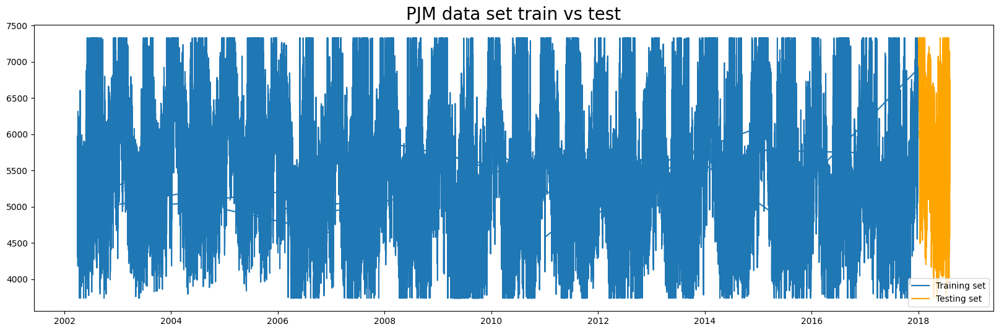

In [97]:
#create a combined graph
import matplotlib.pyplot as plt
plt.figure(figsize=(20,6))
plt.title('PJM data set train vs test',size=20)
plt.plot(train_data['PJMW_MW'],label='Training set')
plt.plot(test_data['PJMW_MW'],label='Testing set',color='orange')
plt.legend()
plt.show()

### Moving Average

`A moving average is a technique that calculates the overall trend in a data set. In operations management, the data set is sales volume from historical data of the company. This technique is very useful for forecasting short-term trends. It is simply the average of a select set of time periods`

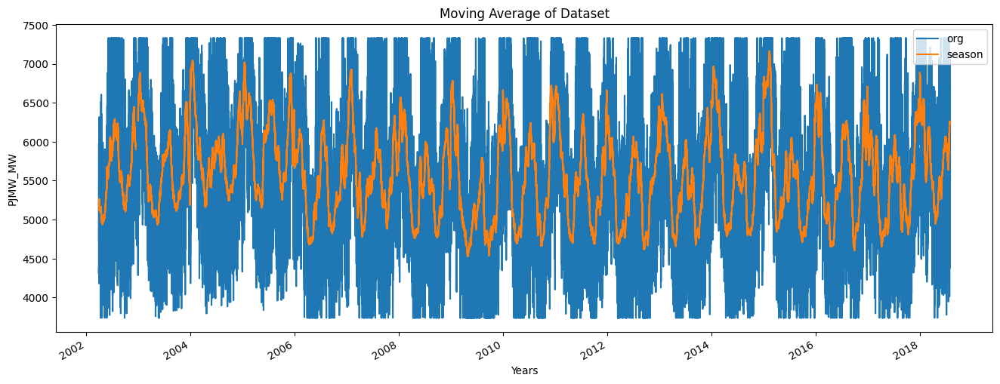

In [98]:
plt.figure(figsize = (16, 6))
df['PJMW_MW'].plot(label="org")
df['PJMW_MW'].rolling(365).mean().plot(label=str(i))
plt.legend(loc='best')
plt.title('Moving Average of Dataset')
plt.xlabel('Years')
plt.ylabel('PJMW_MW')
plt.legend(loc='upper right')
plt.show()

<h3>Observations:</h3>
The movong average finds the trend and no seasonality in the dataset<br>
In the above graph the original trend has a blue color shaded line <br>
After calculating moving average we can see that the trend pattern has been chnage and is has improved the trend line as comapared to in original.It is denoted by red color<br>
but as we increase the number range the seasonality getting vanished<br>
In the end the best fitted line getting which fits maximum numbers of data points on a line

### Time series decomposition plot 

`Time series decomposition is usually presented as an analysis step to be performed before generating predictions, but it can also be used as a forecasting method in and of itself if you know what the structure of your time series will look like beforehand`

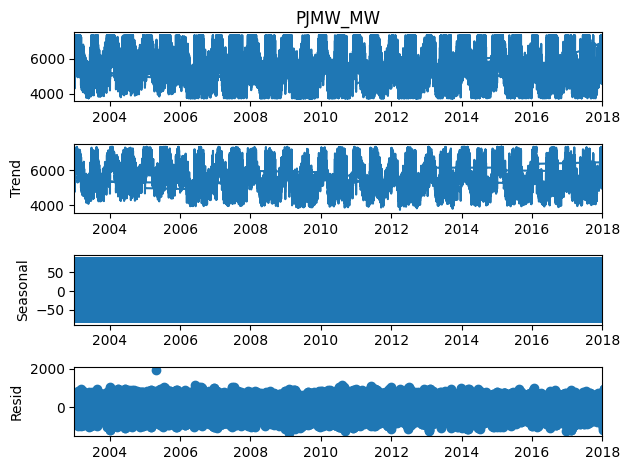

In [99]:
decompose_ts_add = seasonal_decompose(df['PJMW_MW'],period=12)
decompose_ts_add.plot()
plt.show()

<h3>Observations:</h3>
By seasonal_decompose we have got the forecasting components<br>
In trend component it has no ant trend like up and down it is neutral<br>
In seasonal component we did not got any seasonality <br>
And Resid part covers more numbers of datapoints on the line

### ACF plots and PACF plots

`An ACF measures and plots the average correlation between data points in time series and previous values of the series measured for different lag lengths.For Moving average on ehas to look into PCF graph.
 A PACF is similar to an ACF except that each partial correlation controls for any correlation between observations of a shorter lag length.And for Autoregression the PACF graph has been seen.`

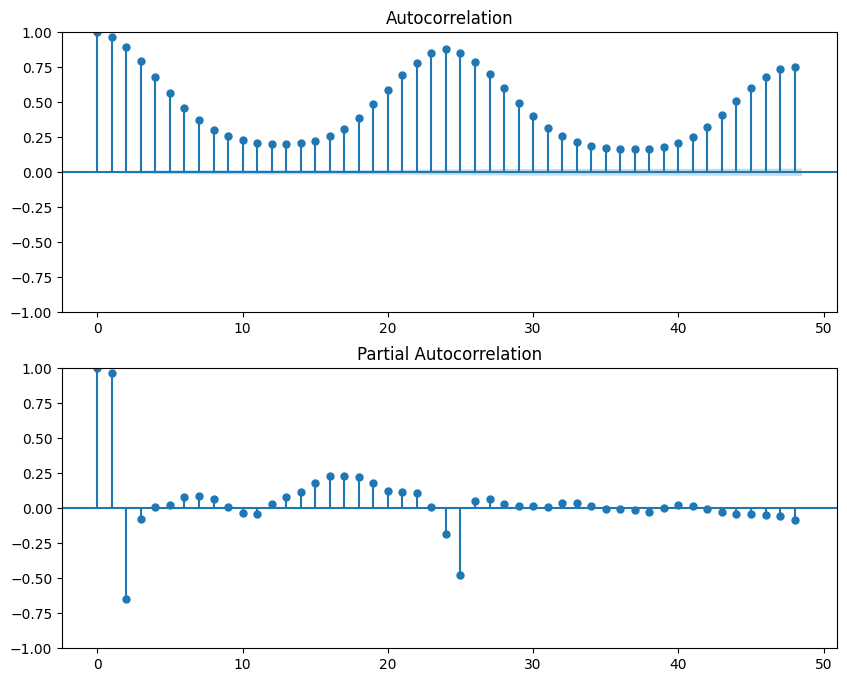

In [100]:
# Create ACF and PACF plots
import statsmodels.graphics.tsaplots as tsa_plots
fig, axes = plt.subplots(2, 1, figsize=(10,8))
tsa_plots.plot_acf(df['PJMW_MW'], lags=48, ax=axes[0])
tsa_plots.plot_pacf(df['PJMW_MW'], lags=48, ax=axes[1])
plt.show()

## Model Building

In [101]:
train_data.shape, test_data.shape

((138070, 15), (5136, 15))

## ARMA model

In [102]:
from statsmodels.tsa.statespace.sarimax import SARIMAX

In [103]:
y=train_data['PJMW_MW']
y

Datetime
2002-12-31 01:00:00    5077.0
2002-12-31 02:00:00    4939.0
2002-12-31 03:00:00    4885.0
2002-12-31 04:00:00    4857.0
2002-12-31 05:00:00    4930.0
                        ...  
2017-01-01 20:00:00    5690.0
2017-01-01 21:00:00    5668.0
2017-01-01 22:00:00    5543.0
2017-01-01 23:00:00    5311.0
2017-01-02 00:00:00    5021.0
Name: PJMW_MW, Length: 138070, dtype: float64

In [104]:
ARMAmodel = SARIMAX(y, order = (1, 0, 1))

In [105]:
arma_model = ARMAmodel.fit()

In [106]:
y_pred = arma_model.get_forecast(len(test_data['PJMW_MW'].index))
y_pred_df = y_pred.conf_int(alpha = 0.05) 
y_pred_df["Predictions"] = arma_model.predict(start = y_pred_df.index[0], end = y_pred_df.index[-1])
y_pred_df.index = test_data.index
y_pred_out1 = y_pred_df["Predictions"]

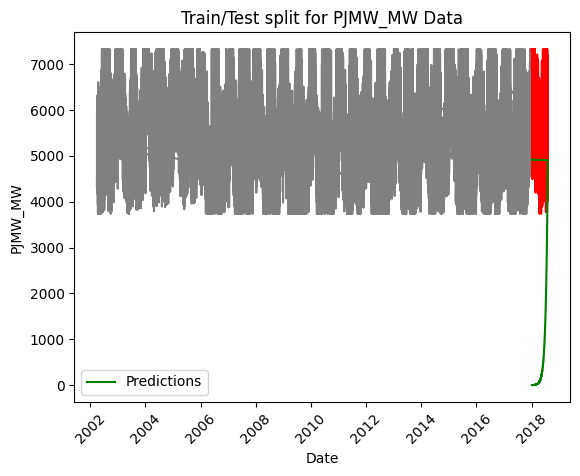

In [107]:
plt.plot(train_data['PJMW_MW'], color = "grey")
plt.plot(test_data['PJMW_MW'], color = "red")
plt.plot(y_pred_out1, color='green', label = 'Predictions')
plt.ylabel('PJMW_MW')
plt.xlabel('Date')
plt.xticks(rotation=45)
plt.title("Train/Test split for PJMW_MW Data")
plt.legend()
plt.show()

In [108]:
import numpy as np
from sklearn.metrics import mean_squared_error, mean_absolute_error
arma_mae = mean_absolute_error(test_data['PJMW_MW'].values, y_pred_df["Predictions"])
arma_rmse = np.sqrt(mean_squared_error(test_data['PJMW_MW'].values, y_pred_df["Predictions"]))

print("MAE: ",arma_mae)
print("RMSE: ",arma_rmse)

MAE:  5178.100308591366
RMSE:  5366.946327343392


## ARIMA model

In [109]:
import itertools

In [110]:
# separate out a validation dataset
dataset, validation = train_data['PJMW_MW'],test_data['PJMW_MW']

print('Dataset %d, Validation %d' % (len(dataset), len(validation)))

Dataset 138070, Validation 5136


In [111]:
dataset.to_csv('dataset.csv', header=False)
validation.to_csv('validation.csv', header=False)

In [112]:
# evaluate a persistence model
train = pd.read_csv('dataset.csv', header=None, index_col=0, parse_dates=True, squeeze=True)
train

0
2002-12-31 01:00:00    5077.0
2002-12-31 02:00:00    4939.0
2002-12-31 03:00:00    4885.0
2002-12-31 04:00:00    4857.0
2002-12-31 05:00:00    4930.0
                        ...  
2017-01-01 20:00:00    5690.0
2017-01-01 21:00:00    5668.0
2017-01-01 22:00:00    5543.0
2017-01-01 23:00:00    5311.0
2017-01-02 00:00:00    5021.0
Name: 1, Length: 138070, dtype: float64

In [113]:
# prepare data
X = train.values
X

array([5077., 4939., 4885., ..., 5543., 5311., 5021.])

In [114]:
X = X.astype('float32')
X

array([5077., 4939., 4885., ..., 5543., 5311., 5021.], dtype=float32)

In [115]:
train_size = int(len(X) * 0.50)
train_size

69035

In [116]:
train, test = X[0:train_size], X[train_size:]

In [117]:
train

array([5077., 4939., 4885., ..., 4490., 4442., 4467.], dtype=float32)

In [118]:
test

array([4548., 4876., 5482., ..., 5543., 5311., 5021.], dtype=float32)

In [123]:
test.shape

(69035,)

In [119]:
# walk-forward validation
history = [x for x in train]
len(history)

69035

In [120]:
predictions = list()

for i in range(len(test)):
    yhat = history[-1]
    predictions.append(yhat)
    
    # observation
    obs = test[i]
    history.append(obs)
    
    print('>Predicted=%.3f, Expected=%.3f' % (yhat, obs))

>Predicted=4467.000, Expected=4548.000
>Predicted=4548.000, Expected=4876.000
>Predicted=4876.000, Expected=5482.000
>Predicted=5482.000, Expected=5702.000
>Predicted=5702.000, Expected=5674.000
>Predicted=5674.000, Expected=5713.000
>Predicted=5713.000, Expected=5775.000
>Predicted=5775.000, Expected=5729.000
>Predicted=5729.000, Expected=5735.000
>Predicted=5735.000, Expected=5694.000
>Predicted=5694.000, Expected=5667.000
>Predicted=5667.000, Expected=5677.000
>Predicted=5677.000, Expected=5814.000
>Predicted=5814.000, Expected=6044.000
>Predicted=6044.000, Expected=6040.000
>Predicted=6040.000, Expected=5991.000
>Predicted=5991.000, Expected=5812.000
>Predicted=5812.000, Expected=5483.000
>Predicted=5483.000, Expected=5050.000
>Predicted=5050.000, Expected=4693.000
>Predicted=4693.000, Expected=4265.000
>Predicted=4265.000, Expected=4228.000
>Predicted=4228.000, Expected=4253.000
>Predicted=4253.000, Expected=4322.000
>Predicted=4322.000, Expected=4491.000
>Predicted=4491.000, Expe

>Predicted=5065.000, Expected=4681.000
>Predicted=4681.000, Expected=4365.000
>Predicted=4365.000, Expected=4244.000
>Predicted=4244.000, Expected=4147.000
>Predicted=4147.000, Expected=4074.000
>Predicted=4074.000, Expected=4065.000
>Predicted=4065.000, Expected=4082.000
>Predicted=4082.000, Expected=4192.000
>Predicted=4192.000, Expected=4423.000
>Predicted=4423.000, Expected=4621.000
>Predicted=4621.000, Expected=4843.000
>Predicted=4843.000, Expected=4879.000
>Predicted=4879.000, Expected=4824.000
>Predicted=4824.000, Expected=4756.000
>Predicted=4756.000, Expected=4681.000
>Predicted=4681.000, Expected=4593.000
>Predicted=4593.000, Expected=4522.000
>Predicted=4522.000, Expected=4479.000
>Predicted=4479.000, Expected=4432.000
>Predicted=4432.000, Expected=4524.000
>Predicted=4524.000, Expected=4470.000
>Predicted=4470.000, Expected=4553.000
>Predicted=4553.000, Expected=4771.000
>Predicted=4771.000, Expected=4684.000
>Predicted=4684.000, Expected=4478.000
>Predicted=4478.000, Expe

In [122]:
# report performance
arima_rmse = sqrt(mean_squared_error(test, predictions))
print('RMSE: %.3f' % arima_rmse)

RMSE: 239.964


In [124]:
# grid search ARIMA parameters for a time series
# evaluate an ARIMA model for a given order (p,d,q) and return RMSE

def evaluate_arima_model(X, arima_order):
    # prepare training dataset
    X = X.astype('float32')
    train_size = int(len(X) * 0.50)
    train, test = X[0:train_size], X[train_size:]
    history = [x for x in train]
    
    # make predictions
    predictions = list()
    for i in range(len(test)):
        model = ARIMA(history, order = arima_order)
        model_fit = model.fit()
        yhat = model_fit.forecast()[0]
        predictions.append(yhat)
        history.append(test[i])
    
    # calculate out of sample error
    rmse = sqrt(mean_squared_error(test, predictions))
    return rmse

In [125]:
# evaluate combinations of p, d and q values for an ARIMA model

def evaluate_models(dataset, p_values, d_values, q_values):
    
    dataset = dataset.astype('float32')
    
    best_score, best_cfg = float('inf'), None
    
    for p,d,q in itertools.product(p_values, d_values, q_values):
    #for p in p_values:
    #    for d in d_values:
    #        for q in q_values:
    
                order = (p,d,q)
                try:
                    rmse = evaluate_arima_model(train, order)
                    if rmse < best_score:
                        best_score, best_cfg = rmse, order
                    print('ARIMA%s RMSE=%.3f' % (order,rmse))
                except:
                    continue
    print('Best ARIMA %s RMSE=%.3f' % (best_cfg, best_score))

In [126]:
# load dataset
train = pd.read_csv('dataset.csv', header=None, index_col=0, parse_dates=True, squeeze=True)
train

0
2002-12-31 01:00:00    5077.0
2002-12-31 02:00:00    4939.0
2002-12-31 03:00:00    4885.0
2002-12-31 04:00:00    4857.0
2002-12-31 05:00:00    4930.0
                        ...  
2017-01-01 20:00:00    5690.0
2017-01-01 21:00:00    5668.0
2017-01-01 22:00:00    5543.0
2017-01-01 23:00:00    5311.0
2017-01-02 00:00:00    5021.0
Name: 1, Length: 138070, dtype: float64

In [127]:
# evaluate parameters
p_values = range(0, 2)
d_values = range(0, 2)
q_values = range(0, 2)

In [128]:
warnings.filterwarnings("ignore")
evaluate_models(train.values, p_values, d_values, q_values)

Best ARIMA None RMSE=inf


In [129]:
# save finalized model to file
# load data
train = pd.read_csv('dataset.csv', header=0, index_col=0, parse_dates=True)
train

,5077.0
2002-12-31 01:00:00,
2002-12-31 02:00:00,4939.0
2002-12-31 03:00:00,4885.0
2002-12-31 04:00:00,4857.0
2002-12-31 05:00:00,4930.0
2002-12-31 06:00:00,5126.0
...,...
2017-01-01 20:00:00,5690.0
2017-01-01 21:00:00,5668.0
2017-01-01 22:00:00,5543.0


In [130]:
# prepare data
X = train.values
X = X.astype('float32')

In [131]:
# Import libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error
import warnings
import itertools
from math import sqrt
import statsmodels.api as sm
from statsmodels.tsa.arima.model import ARIMA, ARIMAResults

In [132]:
# fit model
model = ARIMA(X, order=(1,1,1))
model_fit = model.fit()
forecast = model_fit.forecast(steps = 5136)
forecast

array([4840.74433195, 4729.18802754, 4660.14826204, ..., 4548.03920182,
       4548.03920182, 4548.03920182])

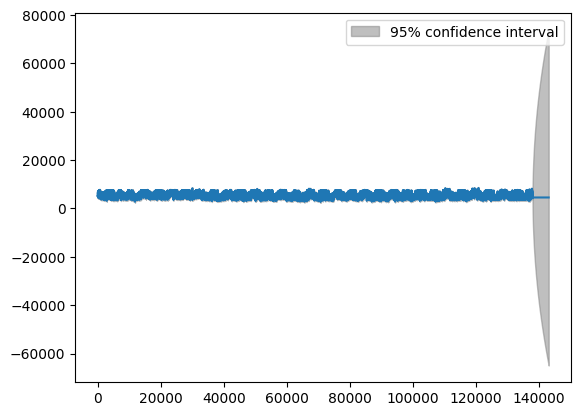

In [133]:
from statsmodels.graphics.tsaplots import plot_predict
plot_predict(model_fit,1,143206)
plt.show()

In [134]:
#Error on the test data
val = pd.read_csv('validation.csv', header=None)
rmse = np.sqrt(mean_squared_error(val[1], forecast))
rmse

1542.504604192611

## Combine train and test data and build final model

In [135]:
# fit model
PJ_data = pd.read_excel('PJMW_MW_Hourly.xlsx', header=0, index_col=0, parse_dates=True)

# prepare data
X = train.values
X = X.astype('float32')

In [136]:
len(X)

138069

In [137]:
model = ARIMA(X, order=(1,1,0))
final_model = model.fit()

In [138]:
final_forecast= final_model.forecast(steps= 5136)
final_forecast

array([4840.5341775 , 4728.23102892, 4658.34523554, ..., 4543.20311763,
       4543.20311763, 4543.20311763])

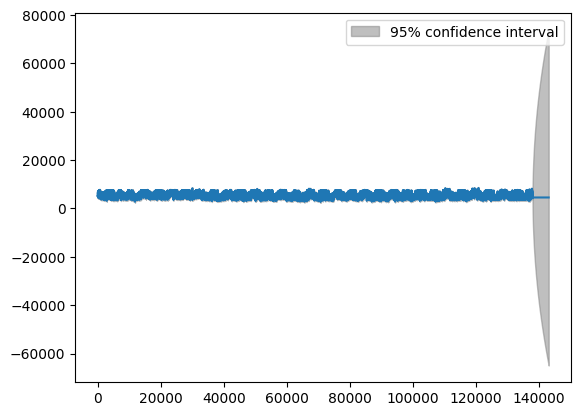

In [139]:
#model_fit.plot_predict(1,143206)
from statsmodels.graphics.tsaplots import plot_predict
plot_predict(model_fit,1,143206)
plt.show()

In [140]:
#Error on the test data
val = pd.read_csv('validation.csv', header=None)
test_rmse = np.sqrt(mean_squared_error(val[1], final_forecast))
test_rmse

1546.4161228324356

In [141]:
# Create future dataframe
future = pd.date_range('2018-08-03','2018-09-03', freq='1h')
future_df = pd.DataFrame(index=future)
future_df

""
2018-08-03 00:00:00
2018-08-03 01:00:00
2018-08-03 02:00:00
2018-08-03 03:00:00
2018-08-03 04:00:00
...
2018-09-02 20:00:00
2018-09-02 21:00:00
2018-09-02 22:00:00
2018-09-02 23:00:00


In [142]:
# next_forecast =model_fit.forecast(745)
# next_forecast

In [143]:
# future_df['Forecast30']=next_forecast

In [144]:
# future_df

In [145]:
x_train = train_data[['hour','dayofweek','quarter','month','year',
           'dayofyear','dayofmonth','weekofyear']]
x_test = test_data[['hour','dayofweek','quarter','month','year',
           'dayofyear','dayofmonth','weekofyear']]
y_train = train_data[['PJMW_MW']]
y_test = test_data[['PJMW_MW']]

In [146]:
x_train.shape,y_test.shape,x_test.shape,y_train.shape

((138070, 8), (5136, 1), (5136, 8), (138070, 1))

## LinearRegression Model

In [147]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import classification_report
lin_model=LinearRegression()
lin_model.fit(x_train,y_train)

LinearRegression()

In [148]:
lin_pred = lin_model.predict(x_test)

In [149]:
lin_pred

array([[5145.46935161],
       [5023.92736003],
       [5085.65699482],
       ...,
       [6503.521317  ],
       [6565.25095179],
       [5051.25012029]])

In [150]:
lin_rmse=sqrt(mean_squared_error(y_test,lin_pred))
lin_rmse

851.3077114432571

In [151]:
lin_mbe = mean_absolute_error(y_test,lin_pred)
lin_mbe

678.8626301473909

## XGBRegressor Model

In [ ]:
from xgboost import XGBRegressor
from sklearn.metrics import r2_score
from sklearn.model_selection import GridSearchCV
from xgboost import plot_importance, plot_tree

### HyperTunning with different Parameters

In [ ]:
# # Various hyper-parameters to tune
# xgb1 = XGBRegressor()
# parameters = {'nthread':[2], #when use hyperthread, xgboost may become slower
#               'objective':['reg:linear'],
#               'learning_rate': [.03, 0.05, .07], #so called `eta` value
#               'max_depth': [10, 15, 20, 25],
#               'min_child_weight': [4],
#               'silent': [1],
#               'subsample': [0.7],
#               'colsample_bytree': [0.7],
#               'n_estimators': [1000]}

# xgb_grid = GridSearchCV(xgb1,
#                         parameters,
#                         cv = 2,
#                         n_jobs = 5,
#                         verbose=True)

# xgb_grid.fit(x_train, y_train)

# print(xgb_grid.best_score_)
# print(xgb_grid.best_params_)

In [ ]:
# create an xgboost regression model
xg_model = XGBRegressor(colsample_bytree= 0.7, learning_rate= 0.03, max_depth= 5, min_child_weight= 4, n_estimators= 500, 
                        nthread= 4, objective= 'reg:linear', silent= 1, subsample= 0.7)
xg_model.fit(x_train, y_train,
       eval_set = [(x_train, y_train), (x_test, y_test)],
        early_stopping_rounds=50,
       verbose=False)


In [ ]:
plot_importance(xg_model, height = 0.5)

In [ ]:
test_data['MW_Prediction'] = xg_model.predict(x_test)
pjme_all = pd.concat([test_data, train_data], sort=False)

In [ ]:
test_data['MW_Prediction']

In [ ]:
pjme_all[['PJMW_MW','MW_Prediction']].plot(figsize=(15, 5))

In [ ]:
xg_rmse = np.sqrt(mean_squared_error(y_true=test_data['PJMW_MW'],y_pred=test_data['MW_Prediction']))
xg_rmse

In [ ]:
xg_mbe = mean_absolute_error(y_true=test_data['PJMW_MW'], y_pred=test_data['MW_Prediction'])
xg_mbe

## RandomForestRegressor Model

In [ ]:
from sklearn.ensemble import RandomForestRegressor

In [ ]:
# Create the parameter grid based on the results of random search 
param_grid = {
    'bootstrap': [True],
    'max_depth': [80, 90, 100, 110],
    'max_features': [2, 3],
    'min_samples_leaf': [3, 4, 5],
    'min_samples_split': [8, 10, 12],
    'n_estimators': [100, 200, 300, 1000]
}
# Create a based model
rf = RandomForestRegressor()
# Instantiate the grid search model
grid_search = GridSearchCV(estimator = rf, param_grid = param_grid, 
                          cv = 3, n_jobs = -1, verbose = 2)
# Fit the grid search to the data
grid_search.fit(train_features, train_labels)
grid_search.best_params_

In [161]:
regr_model = RandomForestRegressor(n_estimators=1000,max_depth=2, random_state=0)
regr_model.fit(x_train, y_train)

RandomForestRegressor(max_depth=2, n_estimators=1000, random_state=0)

In [162]:
test_data['MW_Prediction'] = regr_model.predict(x_test)
pjme_all = pd.concat([test_data, train_data], sort=False)

In [163]:
test_data['MW_Prediction']

Datetime
2018-01-01 00:00:00    5839.942646
2018-08-02 01:00:00    4701.949768
2018-08-02 02:00:00    4701.949768
2018-08-02 03:00:00    4701.949768
2018-08-02 04:00:00    4701.949768
                          ...     
2018-01-01 20:00:00    6142.346374
2018-01-01 21:00:00    6142.346374
2018-01-01 22:00:00    6142.346374
2018-01-01 23:00:00    6142.346374
2018-01-02 00:00:00    5839.942646
Name: MW_Prediction, Length: 5136, dtype: float64

<AxesSubplot:xlabel='Datetime'>

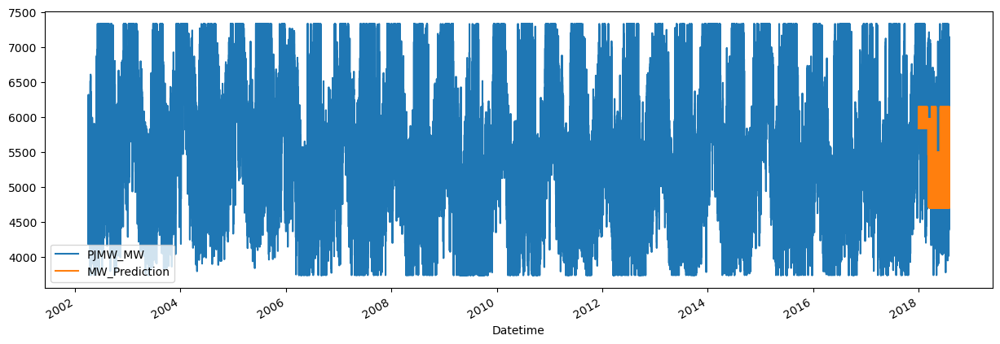

In [164]:
pjme_all[['PJMW_MW','MW_Prediction']].plot(figsize=(15, 5))

In [165]:
regr_rmse = np.sqrt(mean_squared_error(y_true=test_data['PJMW_MW'],y_pred=test_data['MW_Prediction']))
regr_rmse

745.630621977164

In [168]:
regr_mbe = mean_absolute_error(y_true=test_data['PJMW_MW'], y_pred=test_data['MW_Prediction'])
regr_mbe

614.2101231977543

### RMSE of all Models

In [169]:
data = {"MODELS":pd.Series(["ARMA Model","ARIMA Model","LinearRegression Model","XGBRegressor Model",
                            "RandomForestRegressor Model"]),
        "Accuracy":pd.Series([arma_rmse,arima_rmse,lin_rmse,xg_rmse,regr_rmse])}
acc_table=pd.DataFrame(data)
acc_table.sort_values(['Accuracy'],ascending= True)

,MODELS,Accuracy
1,ARIMA Model,239.963715
3,XGBRegressor Model,605.755827
4,RandomForestRegressor Model,745.630622
2,LinearRegression Model,851.307711
0,ARMA Model,5366.946229
